# DonorsChoose

<p>
DonorsChoose.org receives hundreds of thousands of project proposals each year for classroom projects in need of funding. Right now, a large number of volunteers is needed to manually screen each submission before it's approved to be posted on the DonorsChoose.org website.
</p>
<p>
    Next year, DonorsChoose.org expects to receive close to 500,000 project proposals. As a result, there are three main problems they need to solve:
<ul>
<li>
    How to scale current manual processes and resources to screen 500,000 projects so that they can be posted as quickly and as efficiently as possible</li>
    <li>How to increase the consistency of project vetting across different volunteers to improve the experience for teachers</li>
    <li>How to focus volunteer time on the applications that need the most assistance</li>
    </ul>
</p>    
<p>
The goal of the competition is to predict whether or not a DonorsChoose.org project proposal submitted by a teacher will be approved, using the text of project descriptions as well as additional metadata about the project, teacher, and school. DonorsChoose.org can then use this information to identify projects most likely to need further review before approval.
</p>

## About the DonorsChoose Data Set

The `train.csv` data set provided by DonorsChoose contains the following features:

Feature | Description 
----------|---------------
**`project_id`** | A unique identifier for the proposed project. **Example:** `p036502`   
**`project_title`**    | Title of the project. **Examples:**<br><ul><li><code>Art Will Make You Happy!</code></li><li><code>First Grade Fun</code></li></ul> 
**`project_grade_category`** | Grade level of students for which the project is targeted. One of the following enumerated values: <br/><ul><li><code>Grades PreK-2</code></li><li><code>Grades 3-5</code></li><li><code>Grades 6-8</code></li><li><code>Grades 9-12</code></li></ul>  
 **`project_subject_categories`** | One or more (comma-separated) subject categories for the project from the following enumerated list of values:  <br/><ul><li><code>Applied Learning</code></li><li><code>Care &amp; Hunger</code></li><li><code>Health &amp; Sports</code></li><li><code>History &amp; Civics</code></li><li><code>Literacy &amp; Language</code></li><li><code>Math &amp; Science</code></li><li><code>Music &amp; The Arts</code></li><li><code>Special Needs</code></li><li><code>Warmth</code></li></ul><br/> **Examples:** <br/><ul><li><code>Music &amp; The Arts</code></li><li><code>Literacy &amp; Language, Math &amp; Science</code></li>  
  **`school_state`** | State where school is located ([Two-letter U.S. postal code](https://en.wikipedia.org/wiki/List_of_U.S._state_abbreviations#Postal_codes)). **Example:** `WY`
**`project_subject_subcategories`** | One or more (comma-separated) subject subcategories for the project. **Examples:** <br/><ul><li><code>Literacy</code></li><li><code>Literature &amp; Writing, Social Sciences</code></li></ul> 
**`project_resource_summary`** | An explanation of the resources needed for the project. **Example:** <br/><ul><li><code>My students need hands on literacy materials to manage sensory needs!</code</li></ul> 
**`project_essay_1`**    | First application essay<sup>*</sup>  
**`project_essay_2`**    | Second application essay<sup>*</sup> 
**`project_essay_3`**    | Third application essay<sup>*</sup> 
**`project_essay_4`**    | Fourth application essay<sup>*</sup> 
**`project_submitted_datetime`** | Datetime when project application was submitted. **Example:** `2016-04-28 12:43:56.245`   
**`teacher_id`** | A unique identifier for the teacher of the proposed project. **Example:** `bdf8baa8fedef6bfeec7ae4ff1c15c56`  
**`teacher_prefix`** | Teacher's title. One of the following enumerated values: <br/><ul><li><code>nan</code></li><li><code>Dr.</code></li><li><code>Mr.</code></li><li><code>Mrs.</code></li><li><code>Ms.</code></li><li><code>Teacher.</code></li></ul>  
**`teacher_number_of_previously_posted_projects`** | Number of project applications previously submitted by the same teacher. **Example:** `2` 

<sup>*</sup> See the section <b>Notes on the Essay Data</b> for more details about these features.

Additionally, the `resources.csv` data set provides more data about the resources required for each project. Each line in this file represents a resource required by a project:

Feature | Description 
----------|---------------
**`id`** | A `project_id` value from the `train.csv` file.  **Example:** `p036502`   
**`description`** | Desciption of the resource. **Example:** `Tenor Saxophone Reeds, Box of 25`   
**`quantity`** | Quantity of the resource required. **Example:** `3`   
**`price`** | Price of the resource required. **Example:** `9.95`   

**Note:** Many projects require multiple resources. The `id` value corresponds to a `project_id` in train.csv, so you use it as a key to retrieve all resources needed for a project:

The data set contains the following label (the value you will attempt to predict):

Label | Description
----------|---------------
`project_is_approved` | A binary flag indicating whether DonorsChoose approved the project. A value of `0` indicates the project was not approved, and a value of `1` indicates the project was approved.

### Notes on the Essay Data

<ul>
Prior to May 17, 2016, the prompts for the essays were as follows:
<li>__project_essay_1:__ "Introduce us to your classroom"</li>
<li>__project_essay_2:__ "Tell us more about your students"</li>
<li>__project_essay_3:__ "Describe how your students will use the materials you're requesting"</li>
<li>__project_essay_3:__ "Close by sharing why your project will make a difference"</li>
</ul>


<ul>
Starting on May 17, 2016, the number of essays was reduced from 4 to 2, and the prompts for the first 2 essays were changed to the following:<br>
<li>__project_essay_1:__ "Describe your students: What makes your students special? Specific details about their background, your neighborhood, and your school are all helpful."</li>
<li>__project_essay_2:__ "About your project: How will these materials make a difference in your students' learning and improve their school lives?"</li>
<br>For all projects with project_submitted_datetime of 2016-05-17 and later, the values of project_essay_3 and project_essay_4 will be NaN.
</ul>


In [1]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os

from plotly import plotly
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
from collections import Counter

C:\Users\FAISAL\Anaconda3\lib\site-packages\gensim\utils.py:1197: UserWarning: detected Windows; aliasing chunkize to chunkize_serial
  warnings.warn("detected Windows; aliasing chunkize to chunkize_serial")


## 1.1 Reading Data

In [2]:
project_data = pd.read_csv('train_data.csv')
resource_data = pd.read_csv('resources.csv')

In [3]:
print("Number of data points in train data", project_data.shape)
print('-'*50)
print("The attributes of data :", project_data.columns.values)

Number of data points in train data (109248, 17)
--------------------------------------------------
The attributes of data : ['Unnamed: 0' 'id' 'teacher_id' 'teacher_prefix' 'school_state'
 'project_submitted_datetime' 'project_grade_category'
 'project_subject_categories' 'project_subject_subcategories'
 'project_title' 'project_essay_1' 'project_essay_2' 'project_essay_3'
 'project_essay_4' 'project_resource_summary'
 'teacher_number_of_previously_posted_projects' 'project_is_approved']


In [4]:
print("Number of data points in train data", resource_data.shape)
print(resource_data.columns.values)
resource_data.head(2)

Number of data points in train data (1541272, 4)
['id' 'description' 'quantity' 'price']


,id,description,quantity,price
0,p233245,LC652 - Lakeshore Double-Space Mobile Drying Rack,1,149.00
1,p069063,Bouncy Bands for Desks (Blue support pipes),3,14.95


## 1.2 preprocessing of `project_subject_categories`

In [5]:
catogories = list(project_data['project_subject_categories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python
cat_list = []
for i in catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp+=j.strip()+" " #" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_') # we are replacing the & value into 
    cat_list.append(temp.strip())
    
project_data['clean_categories'] = cat_list
project_data.drop(['project_subject_categories'], axis=1, inplace=True)

from collections import Counter
my_counter = Counter()
for word in project_data['clean_categories'].values:
    my_counter.update(word.split())

cat_dict = dict(my_counter)
sorted_cat_dict = dict(sorted(cat_dict.items(), key=lambda kv: kv[1]))


## 1.3 preprocessing of `project_subject_subcategories`

In [6]:
sub_catogories = list(project_data['project_subject_subcategories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python

sub_cat_list = []
for i in sub_catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp +=j.strip()+" "#" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_')
    sub_cat_list.append(temp.strip())

project_data['clean_subcategories'] = sub_cat_list
project_data.drop(['project_subject_subcategories'], axis=1, inplace=True)

# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
my_counter = Counter()
for word in project_data['clean_subcategories'].values:
    my_counter.update(word.split())
    
sub_cat_dict = dict(my_counter)
sorted_sub_cat_dict = dict(sorted(sub_cat_dict.items(), key=lambda kv: kv[1]))

## 1.4 preprocessing of `project_grade_categories`

In [7]:
#preprocessing the catagorical feature
project_data.project_grade_category = project_data.project_grade_category.str.replace('\s+','_')
project_data.project_grade_category = project_data.project_grade_category.str.replace('-','_')
project_data['project_grade_category'].value_counts()

Grades_PreK_2    44225
Grades_3_5       37137
Grades_6_8       16923
Grades_9_12      10963
Name: project_grade_category, dtype: int64

## 1.5 Text preprocessing

In [8]:
# merge two column text dataframe: 
project_data["essay"] = project_data["project_essay_1"].map(str) +\
                        project_data["project_essay_2"].map(str) + \
                        project_data["project_essay_3"].map(str) + \
                        project_data["project_essay_4"].map(str)

In [9]:
project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades_PreK_2,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,0,Literacy_Language,ESL Literacy,My students are English learners that are work...
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Grades_6_8,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,My students need a projector to help with view...,7,1,History_Civics Health_Sports,Civics_Government TeamSports,Our students arrive to our school eager to lea...


In [10]:
#### 1.4.2.3 Using Pretrained Models: TFIDF weighted W2V

In [11]:
# printing some random reviews
print(project_data['essay'].values[0])
print("="*50)
print(project_data['essay'].values[150])
print("="*50)
print(project_data['essay'].values[1000])
print("="*50)
print(project_data['essay'].values[20000])
print("="*50)
print(project_data['essay'].values[99999])
print("="*50)

My students are English learners that are working on English as their second or third languages. We are a melting pot of refugees, immigrants, and native-born Americans bringing the gift of language to our school. \r\n\r\n We have over 24 languages represented in our English Learner program with students at every level of mastery.  We also have over 40 countries represented with the families within our school.  Each student brings a wealth of knowledge and experiences to us that open our eyes to new cultures, beliefs, and respect.\"The limits of your language are the limits of your world.\"-Ludwig Wittgenstein  Our English learner's have a strong support system at home that begs for more resources.  Many times our parents are learning to read and speak English along side of their children.  Sometimes this creates barriers for parents to be able to help their child learn phonetics, letter recognition, and other reading skills.\r\n\r\nBy providing these dvd's and players, students are ab

The mediocre teacher tells. The good teacher explains. The superior teacher demonstrates. The great teacher inspires. -William A. Ward\r\n\r\nMy school has 803 students which is makeup is 97.6% African-American, making up the largest segment of the student body. A typical school in Dallas is made up of 23.2% African-American students. Most of the students are on free or reduced lunch. We aren't receiving doctors, lawyers, or engineers children from rich backgrounds or neighborhoods. As an educator I am inspiring minds of young children and we focus not only on academics but one smart, effective, efficient, and disciplined students with good character.In our classroom we can utilize the Bluetooth for swift transitions during class. I use a speaker which doesn't amplify the sound enough to receive the message. Due to the volume of my speaker my students can't hear videos or books clearly and it isn't making the lessons as meaningful. But with the bluetooth speaker my students will be abl

In [12]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [13]:
sent = decontracted(project_data['essay'].values[20000])
print(sent)
print("="*50)

My kindergarten students have varied disabilities ranging from speech and language delays, cognitive delays, gross/fine motor delays, to autism. They are eager beavers and always strive to work their hardest working past their limitations. \r\n\r\nThe materials we have are the ones I seek out for my students. I teach in a Title I school where most of the students receive free or reduced price lunch.  Despite their disabilities and limitations, my students love coming to school and come eager to learn and explore.Have you ever felt like you had ants in your pants and you needed to groove and move as you were in a meeting? This is how my kids feel all the time. The want to be able to move as they learn or so they say.Wobble chairs are the answer and I love then because they develop their core, which enhances gross motor and in Turn fine motor skills. \r\nThey also want to learn through games, my kids do not want to sit and do worksheets. They want to learn to count by jumping and playing

In [14]:
# \r \n \t remove from string python: http://texthandler.com/info/remove-line-breaks-python/
sent = sent.replace('\\r', ' ')
sent = sent.replace('\\"', ' ')
sent = sent.replace('\\n', ' ')
print(sent)

My kindergarten students have varied disabilities ranging from speech and language delays, cognitive delays, gross/fine motor delays, to autism. They are eager beavers and always strive to work their hardest working past their limitations.     The materials we have are the ones I seek out for my students. I teach in a Title I school where most of the students receive free or reduced price lunch.  Despite their disabilities and limitations, my students love coming to school and come eager to learn and explore.Have you ever felt like you had ants in your pants and you needed to groove and move as you were in a meeting? This is how my kids feel all the time. The want to be able to move as they learn or so they say.Wobble chairs are the answer and I love then because they develop their core, which enhances gross motor and in Turn fine motor skills.   They also want to learn through games, my kids do not want to sit and do worksheets. They want to learn to count by jumping and playing. Phys

In [15]:
#remove spacial character: https://stackoverflow.com/a/5843547/4084039
sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
print(sent)

My kindergarten students have varied disabilities ranging from speech and language delays cognitive delays gross fine motor delays to autism They are eager beavers and always strive to work their hardest working past their limitations The materials we have are the ones I seek out for my students I teach in a Title I school where most of the students receive free or reduced price lunch Despite their disabilities and limitations my students love coming to school and come eager to learn and explore Have you ever felt like you had ants in your pants and you needed to groove and move as you were in a meeting This is how my kids feel all the time The want to be able to move as they learn or so they say Wobble chairs are the answer and I love then because they develop their core which enhances gross motor and in Turn fine motor skills They also want to learn through games my kids do not want to sit and do worksheets They want to learn to count by jumping and playing Physical engagement is the

In [16]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
stopwords= ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"]

In [17]:
# Combining all the above stundents 
from tqdm import tqdm
preprocessed_essays = []
# tqdm is for printing the status bar
for sentance in tqdm(project_data['essay'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e not in stopwords)
    preprocessed_essays.append(sent.lower().strip())

100%|████████████████████████████████████████████████████████████████████████| 109248/109248 [01:17<00:00, 1401.33it/s]


In [18]:
# after preprocesing
preprocessed_essays[20000]

'my kindergarten students varied disabilities ranging speech language delays cognitive delays gross fine motor delays autism they eager beavers always strive work hardest working past limitations the materials ones i seek students i teach title i school students receive free reduced price lunch despite disabilities limitations students love coming school come eager learn explore have ever felt like ants pants needed groove move meeting this kids feel time the want able move learn say wobble chairs answer i love develop core enhances gross motor turn fine motor skills they also want learn games kids not want sit worksheets they want learn count jumping playing physical engagement key success the number toss color shape mats make happen my students forget work fun 6 year old deserves nannan'

<h2><font color='red'> 1.6 Preprocessing of `project_title`</font></h2>

In [19]:
# similarly you can preprocess the titles also

In [20]:
# printing some random essay titles.
print(project_data['project_title'].values[0])
print("="*50)
print(project_data['project_title'].values[400])
print("="*50)
print(project_data['project_title'].values[25000])
print("="*50)
print(project_data['project_title'].values[50000])
print("="*50)
print(project_data['project_title'].values[99999])
print("="*50)

Educational Support for English Learners at Home
Leave It Better Than You Found It!
Moving To Learn and Creative Expression
Help our Bridgeport Students to Improve Their Listening Skills!
Inspiring Minds by Enhancing the Educational Experience


In [21]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [22]:
sent = decontracted(project_data['project_title'].values[20000])
print(sent)
print("="*50)

We Need To Move It While We Input It!


In [23]:
# \r \n \t remove from string python: http://texthandler.com/info/remove-line-breaks-python/
sent = sent.replace('\\r', ' ')
sent = sent.replace('\\"', ' ')
sent = sent.replace('\\n', ' ')
print(sent)

We Need To Move It While We Input It!


In [24]:
#remove spacial character: https://stackoverflow.com/a/5843547/4084039
sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
print(sent)

We Need To Move It While We Input It 


In [25]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
stopwords= ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"]

In [26]:
# Combining all the above statemennts 
from tqdm import tqdm
preprocessed_project_title = []
# tqdm is for printing the status bar
for sentance in tqdm(project_data['project_title'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e not in stopwords)
    preprocessed_project_title.append(sent.lower().strip())

100%|███████████████████████████████████████████████████████████████████████| 109248/109248 [00:03<00:00, 30765.67it/s]


In [27]:
# after preprocesing
preprocessed_project_title[20000]

'we need to move it while we input it'

## 1.7 Preparing data for models

In [28]:
# adding the columns of preprocessed_essays & preprocessed_project_title to the main dataframe
project_data["preprocessed_essays"]=preprocessed_essays
project_data["preprocessed_project_title"]=preprocessed_project_title

In [29]:
project_data.columns

Index(['Unnamed: 0', 'id', 'teacher_id', 'teacher_prefix', 'school_state',
       'project_submitted_datetime', 'project_grade_category', 'project_title',
       'project_essay_1', 'project_essay_2', 'project_essay_3',
       'project_essay_4', 'project_resource_summary',
       'teacher_number_of_previously_posted_projects', 'project_is_approved',
       'clean_categories', 'clean_subcategories', 'essay',
       'preprocessed_essays', 'preprocessed_project_title'],
      dtype='object')

we are going to consider

       - school_state : categorical data
       - clean_categories : categorical data
       - clean_subcategories : categorical data
       - project_grade_category : categorical data
       - teacher_prefix : categorical data
       
       - project_title : text data
       - text : text data
       - project_resource_summary: text data (optinal)
       
       - quantity : numerical (optinal)
       - teacher_number_of_previously_posted_projects : numerical
       - price : numerical

####  Using Pretrained Models: Avg W2V

In [30]:
# Reading glove vectors in python: https://stackoverflow.com/a/38230349/4084039
def loadGloveModel(gloveFile):
    print ("Loading Glove Model")
    f = open(gloveFile,'r', encoding="utf8")
    model = {}
    for line in tqdm(f):
        splitLine = line.split()
        word = splitLine[0]
        embedding = np.array([float(val) for val in splitLine[1:]])
        model[word] = embedding
    print ("Done.",len(model)," words loaded!")
    return model
model = loadGloveModel('glove.42B.300d.txt')

# ============================
#Output:
    
#Loading Glove Model
#1917495it [06:32, 4879.69it/s]
#Done. 1917495  words loaded!

# ============================

words = []
for i in preprocessed_essays:
    words.extend(i.split(' '))

for i in preprocessed_project_title:
    words.extend(i.split(' '))
print("all the words in the coupus", len(words))
words = set(words)
print("the unique words in the coupus", len(words))

inter_words = set(model.keys()).intersection(words)
print("The number of words that are present in both glove vectors and our coupus", \
      len(inter_words),"(",np.round(len(inter_words)/len(words)*100,3),"%)")

words_courpus = {}
words_glove = set(model.keys())
for i in words:
    if i in words_glove:
        words_courpus[i] = model[i]
print("word 2 vec length", len(words_courpus))


# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/

import pickle
with open('glove_vectors', 'wb') as f:
    pickle.dump(words_courpus, f)

Loading Glove Model


1917495it [10:06, 3162.53it/s]


Done. 1917495  words loaded!
all the words in the coupus 17014413
the unique words in the coupus 58968
The number of words that are present in both glove vectors and our coupus 51503 ( 87.341 %)
word 2 vec length 51503


In [31]:
price_data = resource_data.groupby('id').agg({'price':'sum', 'quantity':'sum'}).reset_index()
project_data = pd.merge(project_data, price_data, on='id', how='left')

In [32]:
# please write all the code with proper documentation, and proper titles for each subsection
# when you plot any graph make sure you use 
    # a. Title, that describes your plot, this will be very helpful to the reader
    # b. Legends if needed
    # c. X-axis label
    # d. Y-axis label

__ Computing Sentiment Scores__

In [33]:
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer

# import nltk
# nltk.download('vader_lexicon')

sid = SentimentIntensityAnalyzer()

for_sentiment = 'a person is a person no matter how small dr seuss i teach the smallest students with the biggest enthusiasm \
for learning my students learn in many different ways using all of our senses and multiple intelligences i use a wide range\
of techniques to help all my students succeed students in my class come from a variety of different backgrounds which makes\
for wonderful sharing of experiences and cultures including native americans our school is a caring community of successful \
learners which can be seen through collaborative student project based learning in and out of the classroom kindergarteners \
in my class love to work with hands on materials and have many different opportunities to practice a skill before it is\
mastered having the social skills to work cooperatively with friends is a crucial aspect of the kindergarten curriculum\
montana is the perfect place to learn about agriculture and nutrition my students love to role play in our pretend kitchen\
in the early childhood classroom i have had several kids ask me can we try cooking with real food i will take their idea \
and create common core cooking lessons where we learn important math and writing concepts while cooking delicious healthy \
food for snack time my students will have a grounded appreciation for the work that went into making the food and knowledge \
of where the ingredients came from as well as how it is healthy for their bodies this project would expand our learning of \
nutrition and agricultural cooking recipes by having us peel our own apples to make homemade applesauce make our own bread \
and mix up healthy plants from our classroom garden in the spring we will also create our own cookbooks to be printed and \
shared with families students will gain math and literature skills as well as a life long enjoyment for healthy cooking \
nannan'
ss = sid.polarity_scores(for_sentiment)

for k in ss:
    print('{0}: {1}, '.format(k, ss[k]), end='')

# we can use these 4 things as features/attributes (neg, neu, pos, compound)
# neg: 0.0, neu: 0.753, pos: 0.247, compound: 0.93

neg: 0.01, neu: 0.745, pos: 0.245, compound: 0.9975, 

In [34]:
sentiment_pos=[]
for preprocessed_essay in preprocessed_essays:
    sentiment_pos.append(sid.polarity_scores(preprocessed_essay) ['pos'])

In [35]:
project_data["Positive_Sentiment_scores"] = sentiment_pos

In [36]:
sentiment_neg=[]
for preprocessed_essay in preprocessed_essays:
    sentiment_neg.append(sid.polarity_scores(preprocessed_essay) ['neg'])

In [37]:
project_data["Negative_Sentiment_scores"] = sentiment_neg

In [38]:
sentiment_neu=[]
for preprocessed_essay in preprocessed_essays:
    sentiment_neu.append(sid.polarity_scores(preprocessed_essay) ['neu'])

In [39]:
project_data["Neutral_Sentiment_scores"] = sentiment_neu

In [40]:
sentiment_com=[]
for preprocessed_essay in preprocessed_essays:
    sentiment_com.append(sid.polarity_scores(preprocessed_essay) ['compound'])

In [41]:
project_data["Compound_Sentiment_scores"] = sentiment_com

# Assignment 9: RF and GBDT

#### Response Coding: Example

<img src='response.JPG' width=700px>

> The response tabel is built only on train dataset.
> For a category which is not there in train data and present in test data, we will encode them with default values
Ex: in our test data if have State: D then we encode it as [0.5, 0.05]

<ol>
    <li><strong>Apply both Random Forrest and GBDT on these feature sets</strong>
        <ul>
            <li><font color='red'>Set 1</font>: categorical(instead of one hot encoding, try <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/handling-categorical-and-numerical-features/'>response coding</a>: use probability values), numerical features + project_title(BOW) + preprocessed_eassay (BOW)</li>
            <li><font color='red'>Set 2</font>: categorical(instead of one hot encoding, try <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/handling-categorical-and-numerical-features/'>response coding</a>: use probability values), numerical features + project_title(TFIDF)+  preprocessed_eassay (TFIDF)</li>
            <li><font color='red'>Set 3</font>: categorical(instead of one hot encoding, try <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/handling-categorical-and-numerical-features/'>response coding</a>: use probability values), numerical features + project_title(AVG W2V)+  preprocessed_eassay (AVG W2V)</li>
            <li><font color='red'>Set 4</font>: categorical(instead of one hot encoding, try <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/handling-categorical-and-numerical-features/'>response coding</a>: use probability values), numerical features + project_title(TFIDF W2V)+  preprocessed_eassay (TFIDF W2V)</li>        </ul>
    </li>
    <br>
    <li><strong>The hyper paramter tuning (Consider any two hyper parameters preferably n_estimators, max_depth)</strong>
        <ul>
    <li>Find the best hyper parameter which will give the maximum <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/receiver-operating-characteristic-curve-roc-curve-and-auc-1/'>AUC</a> value</li>
    <li>find the best hyper paramter using k-fold cross validation/simple cross validation data</li>
    <li>use gridsearch cv or randomsearch cv or you can write your own for loops to do this task</li>
        </ul>
    </li>
    <br>
    <li>
    <strong>Representation of results</strong>
        <ul>
    <li>You need to plot the performance of model both on train data and cross validation data for each hyper parameter, like shown in the figure
    <img src='3d_plot.JPG' width=500px> with X-axis as <strong>n_estimators</strong>, Y-axis as <strong>max_depth</strong>, and Z-axis as <strong>AUC Score</strong> , we have given the notebook which explains how to plot this 3d plot, you can find it in the same drive <i>3d_scatter_plot.ipynb</i></li>
            <p style="text-align:center;font-size:30px;color:red;"><strong>or</strong></p> <br>
    <li>You need to plot the performance of model both on train data and cross validation data for each hyper parameter, like shown in the figure
    <img src='heat_map.JPG' width=300px> <a href='https://seaborn.pydata.org/generated/seaborn.heatmap.html'>seaborn heat maps</a> with rows as <strong>n_estimators</strong>, columns as <strong>max_depth</strong>, and values inside the cell representing <strong>AUC Score</strong> </li>
    <li>You can choose either of the plotting techniques: 3d plot or heat map</li>
    <li>Once after you found the best hyper parameter, you need to train your model with it, and find the AUC on test data and plot the ROC curve on both train and test.
    <img src='train_test_auc.JPG' width=300px></li>
    <li>Along with plotting ROC curve, you need to print the <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/confusion-matrix-tpr-fpr-fnr-tnr-1/'>confusion matrix</a> with predicted and original labels of test data points
    <img src='confusion_matrix.png' width=300px></li>
            </ul>
    <br>
    <li><strong>Conclusion</strong>
        <ul>
    <li>You need to summarize the results at the end of the notebook, summarize it in the table format. To print out a table please refer to this prettytable library<a href='http://zetcode.com/python/prettytable/'>  link</a> 
        <img src='summary.JPG' width=400px>
    </li>
        </ul>
</ol>

<h4><font color='red'>Note: Data Leakage</font></h4>

1. There will be an issue of data-leakage if you vectorize the entire data and then split it into train/cv/test.
2. To avoid the issue of data-leakag, make sure to split your data first and then vectorize it. 
3. While vectorizing your data, apply the method fit_transform() on you train data, and apply the method transform() on cv/test data.
4. For more details please go through this <a href='https://soundcloud.com/applied-ai-course/leakage-bow-and-tfidf'>link.</a>

<h1>2. Random Forest and GBDT </h1>

<h2>2.1 Splitting data into Train and cross validation(or test): Stratified Sampling</h2>

In [42]:
# please write all the code with proper documentation, and proper titles for each subsection
# go through documentations and blogs before you start coding
# first figure out what to do, and then think about how to do.
# reading and understanding error messages will be very much helpfull in debugging your code
# when you plot any graph make sure you use 
    # a. Title, that describes your plot, this will be very helpful to the reader
    # b. Legends if needed
    # c. X-axis label
    # d. Y-axis label

In [43]:
X=project_data[0:50000]
y = project_data['project_is_approved'][0:50000].values

In [44]:
# train test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, stratify=y)
X_train, X_cv, y_train, y_cv = train_test_split(X_train, y_train, test_size=0.33, stratify=y_train)

In [45]:
print(X_train.shape, y_train.shape)
print(X_cv.shape, y_cv.shape)
print(X_test.shape, y_test.shape)

print("="*100)

(22445, 26) (22445,)
(11055, 26) (11055,)
(16500, 26) (16500,)


<h2>2.2 Make Data Model Ready: encoding numerical, categorical features</h2>

In [46]:
# please write all the code with proper documentation, and proper titles for each subsection
# go through documentations and blogs before you start coding 
# first figure out what to do, and then think about how to do.
# reading and understanding error messages will be very much helpfull in debugging your code
# make sure you featurize train and test data separatly

# when you plot any graph make sure you use 
    # a. Title, that describes your plot, this will be very helpful to the reader
    # b. Legends if needed
    # c. X-axis label
    # d. Y-axis label

### 2.2.1 Response Coding of Categorical data

In [47]:
def response_values(feature, df):
    value_count = df[feature].value_counts()
    response_values_dict = dict()
    for i,j in value_count.items():
        vec = []
        for k in range(0,2):
            res_val =len( df.loc[(df['project_is_approved']==k) & (df[feature]==i)])/len( df.loc[(df[feature]==i)])
            vec.append(res_val)
            response_values_dict[i]=vec
    return response_values_dict

In [48]:
def array_response_code(feature, df):
    response_values_dict = response_values(feature, X_train)
    value_count = X_train[feature].value_counts()
    gv_fea = []
    for index, row in df.iterrows():
        if row[feature] in dict(value_count).keys():
            gv_fea.append(response_values_dict[row[feature]])
        else:
            gv_fea.append([0.5,0.5])           
    return gv_fea

### Clean Categories

In [49]:
response_values('clean_categories', X_train)

{'Literacy_Language': [0.1383151073309032, 0.8616848926690968],
 'Math_Science': [0.18048780487804877, 0.8195121951219512],
 'Literacy_Language Math_Science': [0.12843729040912139, 0.8715627095908786],
 'Health_Sports': [0.15446768060836502, 0.845532319391635],
 'Music_Arts': [0.13320647002854424, 0.8667935299714558],
 'SpecialNeeds': [0.17633136094674556, 0.8236686390532545],
 'Literacy_Language SpecialNeeds': [0.16064757160647572, 0.8393524283935243],
 'AppliedLearning': [0.19764397905759162, 0.8023560209424084],
 'Math_Science Literacy_Language': [0.12875536480686695, 0.871244635193133],
 'AppliedLearning Literacy_Language': [0.14505494505494507,
  0.8549450549450549],
 'History_Civics': [0.17884130982367757, 0.8211586901763224],
 'Math_Science SpecialNeeds': [0.17302798982188294, 0.8269720101781171],
 'Literacy_Language Music_Arts': [0.18666666666666668, 0.8133333333333334],
 'Math_Science Music_Arts': [0.18012422360248448, 0.8198757763975155],
 'History_Civics Literacy_Language': 

In [50]:
X_train_clean_categories_res_code = array_response_code('clean_categories', X_train)
X_cv_clean_categories_res_code = array_response_code('clean_categories', X_cv)
X_test_clean_categories_res_code = array_response_code('clean_categories', X_test)

print("After response coding :")
print(np.shape(X_train_clean_categories_res_code))
print(np.shape(X_cv_clean_categories_res_code))
print(np.shape(X_test_clean_categories_res_code))

After response coding :
(22445, 2)
(11055, 2)
(16500, 2)


### Clean Sub-Categories

In [51]:
response_values('clean_subcategories', X_train)

{'Literacy': [0.11836935166994106, 0.8816306483300589],
 'Literacy Mathematics': [0.12016175621028308, 0.879838243789717],
 'Literature_Writing Mathematics': [0.13851351351351351, 0.8614864864864865],
 'Literacy Literature_Writing': [0.14334763948497853, 0.8566523605150215],
 'Mathematics': [0.1669724770642202, 0.8330275229357799],
 'Literature_Writing': [0.16943521594684385, 0.8305647840531561],
 'SpecialNeeds': [0.17633136094674556, 0.8236686390532545],
 'Health_Wellness': [0.14112903225806453, 0.8588709677419355],
 'AppliedSciences Mathematics': [0.17630057803468208, 0.8236994219653179],
 'AppliedSciences': [0.19305019305019305, 0.806949806949807],
 'Literacy SpecialNeeds': [0.14699792960662525, 0.8530020703933747],
 'ESL Literacy': [0.12684989429175475, 0.8731501057082452],
 'Gym_Fitness Health_Wellness': [0.12446351931330472, 0.8755364806866953],
 'VisualArts': [0.15476190476190477, 0.8452380952380952],
 'Music': [0.10543130990415335, 0.8945686900958466],
 'Warmth Care_Hunger': [0

In [52]:
X_train_clean_subcategories_res_code = array_response_code('clean_subcategories', X_train)
X_cv_clean_subcategories_res_code = array_response_code('clean_subcategories', X_cv)
X_test_clean_subcategories_res_code = array_response_code('clean_subcategories', X_test)

print("After response coding :")
print(np.shape(X_train_clean_subcategories_res_code))
print(np.shape(X_cv_clean_subcategories_res_code))
print(np.shape(X_test_clean_subcategories_res_code))

After response coding :
(22445, 2)
(11055, 2)
(16500, 2)


### Teacher Prefix

In [53]:
#replacing the nan values with blank spaces(pre-processing categorical feature)
X_train["teacher_prefix"].fillna(" ", inplace = True)
X_cv["teacher_prefix"].fillna(" ", inplace = True)
X_test["teacher_prefix"].fillna(" ", inplace = True)

In [54]:
response_values('teacher_prefix', X_train)

{'Mrs.': [0.14772920564721892, 0.8522707943527811],
 'Ms.': [0.15875593305021235, 0.8412440669497877],
 'Mr.': [0.1662112932604736, 0.8337887067395264],
 'Teacher': [0.18503118503118504, 0.814968814968815],
 ' ': [0.0, 1.0],
 'Dr.': [0.5, 0.5]}

In [55]:
X_train_teacher_prefix_res_code = array_response_code('teacher_prefix', X_train)
X_cv_teacher_prefix_res_code = array_response_code('teacher_prefix', X_cv)
X_test_teacher_prefix_res_code = array_response_code('teacher_prefix', X_test)

print("After response coding :")
print(np.shape(X_train_teacher_prefix_res_code))
print(np.shape(X_cv_teacher_prefix_res_code))
print(np.shape(X_test_teacher_prefix_res_code))

After response coding :
(22445, 2)
(11055, 2)
(16500, 2)


### School State

In [56]:
response_values('school_state', X_train)

{'CA': [0.14580686149936467, 0.8541931385006353],
 'NY': [0.1409090909090909, 0.8590909090909091],
 'TX': [0.20611702127659576, 0.7938829787234043],
 'FL': [0.17862838915470494, 0.8213716108452951],
 'NC': [0.13406795224977044, 0.8659320477502296],
 'IL': [0.16106604866743918, 0.8389339513325609],
 'GA': [0.15517241379310345, 0.8448275862068966],
 'SC': [0.13688212927756654, 0.8631178707224335],
 'MI': [0.1691842900302115, 0.8308157099697885],
 'PA': [0.1453125, 0.8546875],
 'IN': [0.17115384615384616, 0.8288461538461539],
 'MO': [0.1392156862745098, 0.8607843137254902],
 'OH': [0.11591355599214145, 0.8840864440078585],
 'MA': [0.15139442231075698, 0.848605577689243],
 'OK': [0.15856236786469344, 0.8414376321353065],
 'LA': [0.18376068376068377, 0.8162393162393162],
 'WA': [0.09782608695652174, 0.9021739130434783],
 'NJ': [0.1670428893905192, 0.8329571106094809],
 'AZ': [0.14578587699316628, 0.8542141230068337],
 'VA': [0.1313364055299539, 0.868663594470046],
 'AL': [0.158311345646438,

In [57]:
X_train_school_state_res_code = array_response_code('school_state', X_train)
X_cv_school_state_res_code = array_response_code('school_state', X_cv)
X_test_school_state_res_code = array_response_code('school_state', X_test)

print("After response coding :")
print(np.shape(X_train_school_state_res_code))
print(np.shape(X_cv_school_state_res_code))
print(np.shape(X_test_school_state_res_code))

After response coding :
(22445, 2)
(11055, 2)
(16500, 2)


### Project Grade Category

In [58]:
response_values('project_grade_category', X_train)

{'Grades_PreK_2': [0.15165876777251186, 0.8483412322274881],
 'Grades_3_5': [0.1498221109500593, 0.8501778890499407],
 'Grades_6_8': [0.1569468267581475, 0.8430531732418525],
 'Grades_9_12': [0.17549234135667396, 0.8245076586433261]}

In [59]:
X_train_project_grade_category_res_code = array_response_code('project_grade_category', X_train)
X_cv_project_grade_category_res_code = array_response_code('project_grade_category', X_cv)
X_test_project_grade_category_res_code = array_response_code('project_grade_category', X_test)

print("After response coding :")
print(np.shape(X_train_project_grade_category_res_code))
print(np.shape(X_cv_project_grade_category_res_code))
print(np.shape(X_test_project_grade_category_res_code))

After response coding :
(22445, 2)
(11055, 2)
(16500, 2)


### 2.2.2 Vectorizing Numerical features

In [60]:
from sklearn.preprocessing import Normalizer
normalizer = Normalizer()
# normalizer.fit(X_train['price'].values)
# this will rise an error Expected 2D array, got 1D array instead: 
# array=[105.22 215.96  96.01 ... 368.98  80.53 709.67].
# Reshape your data either using 
# array.reshape(-1, 1) if your data has a single feature 
# array.reshape(1, -1)  if it contains a single sample.
normalizer.fit(X_train['price'].values.reshape(-1,1))

X_train_price_norm = normalizer.transform(X_train['price'].values.reshape(-1,1))
X_cv_price_norm = normalizer.transform(X_cv['price'].values.reshape(-1,1))
X_test_price_norm = normalizer.transform(X_test['price'].values.reshape(-1,1))

print("After vectorizations")
print(X_train_price_norm.shape, y_train.shape)
print(X_cv_price_norm.shape, y_cv.shape)
print(X_test_price_norm.shape, y_test.shape)
print("="*100)

After vectorizations
(22445, 1) (22445,)
(11055, 1) (11055,)
(16500, 1) (16500,)


In [61]:
from sklearn.preprocessing import Normalizer
normalizer = Normalizer()
# normalizer.fit(X_train['price'].values)
# this will rise an error Expected 2D array, got 1D array instead: 
# array=[105.22 215.96  96.01 ... 368.98  80.53 709.67].
# Reshape your data either using 
# array.reshape(-1, 1) if your data has a single feature 
# array.reshape(1, -1)  if it contains a single sample.
normalizer.fit(X_train['Negative_Sentiment_scores'].values.reshape(-1,1))

X_train_Negative_Sentiment_scores_norm = normalizer.transform(X_train['Negative_Sentiment_scores'].values.reshape(-1,1))
X_cv_Negative_Sentiment_scores_norm = normalizer.transform(X_cv['Negative_Sentiment_scores'].values.reshape(-1,1))
X_test_Negative_Sentiment_scores_norm = normalizer.transform(X_test['Negative_Sentiment_scores'].values.reshape(-1,1))

print("After vectorizations")
print(X_train_Negative_Sentiment_scores_norm.shape, y_train.shape)
print(X_cv_Negative_Sentiment_scores_norm.shape, y_cv.shape)
print(X_test_Negative_Sentiment_scores_norm.shape, y_test.shape)
print("="*100)

After vectorizations
(22445, 1) (22445,)
(11055, 1) (11055,)
(16500, 1) (16500,)


In [62]:
from sklearn.preprocessing import Normalizer
normalizer = Normalizer()
# normalizer.fit(X_train['price'].values)
# this will rise an error Expected 2D array, got 1D array instead: 
# array=[105.22 215.96  96.01 ... 368.98  80.53 709.67].
# Reshape your data either using 
# array.reshape(-1, 1) if your data has a single feature 
# array.reshape(1, -1)  if it contains a single sample.
normalizer.fit(X_train['Positive_Sentiment_scores'].values.reshape(-1,1))

X_train_Positive_Sentiment_scores_norm = normalizer.transform(X_train['Positive_Sentiment_scores'].values.reshape(-1,1))
X_cv_Positive_Sentiment_scores_norm = normalizer.transform(X_cv['Positive_Sentiment_scores'].values.reshape(-1,1))
X_test_Positive_Sentiment_scores_norm = normalizer.transform(X_test['Positive_Sentiment_scores'].values.reshape(-1,1))

print("After vectorizations")
print(X_train_Positive_Sentiment_scores_norm.shape, y_train.shape)
print(X_cv_Positive_Sentiment_scores_norm.shape, y_cv.shape)
print(X_test_Positive_Sentiment_scores_norm.shape, y_test.shape)
print("="*100)

After vectorizations
(22445, 1) (22445,)
(11055, 1) (11055,)
(16500, 1) (16500,)


In [63]:
from sklearn.preprocessing import Normalizer
normalizer = Normalizer()
# normalizer.fit(X_train['price'].values)
# this will rise an error Expected 2D array, got 1D array instead: 
# array=[105.22 215.96  96.01 ... 368.98  80.53 709.67].
# Reshape your data either using 
# array.reshape(-1, 1) if your data has a single feature 
# array.reshape(1, -1)  if it contains a single sample.
normalizer.fit(X_train['Neutral_Sentiment_scores'].values.reshape(-1,1))

X_train_Neutral_Sentiment_scores_norm = normalizer.transform(X_train['Neutral_Sentiment_scores'].values.reshape(-1,1))
X_cv_Neutral_Sentiment_scores_norm = normalizer.transform(X_cv['Neutral_Sentiment_scores'].values.reshape(-1,1))
X_test_Neutral_Sentiment_scores_norm = normalizer.transform(X_test['Neutral_Sentiment_scores'].values.reshape(-1,1))

print("After vectorizations")
print(X_train_Neutral_Sentiment_scores_norm.shape, y_train.shape)
print(X_cv_Neutral_Sentiment_scores_norm.shape, y_cv.shape)
print(X_test_Neutral_Sentiment_scores_norm.shape, y_test.shape)
print("="*100)

After vectorizations
(22445, 1) (22445,)
(11055, 1) (11055,)
(16500, 1) (16500,)


In [64]:
from sklearn.preprocessing import Normalizer
normalizer = Normalizer()
# normalizer.fit(X_train['price'].values)
# this will rise an error Expected 2D array, got 1D array instead: 
# array=[105.22 215.96  96.01 ... 368.98  80.53 709.67].
# Reshape your data either using 
# array.reshape(-1, 1) if your data has a single feature 
# array.reshape(1, -1)  if it contains a single sample.
normalizer.fit(X_train['Compound_Sentiment_scores'].values.reshape(-1,1))

X_train_Compound_Sentiment_scores_norm = normalizer.transform(X_train['Compound_Sentiment_scores'].values.reshape(-1,1))
X_cv_Compound_Sentiment_scores_norm = normalizer.transform(X_cv['Compound_Sentiment_scores'].values.reshape(-1,1))
X_test_Compound_Sentiment_scores_norm = normalizer.transform(X_test['Compound_Sentiment_scores'].values.reshape(-1,1))

print("After vectorizations")
print(X_train_Compound_Sentiment_scores_norm.shape, y_train.shape)
print(X_cv_Compound_Sentiment_scores_norm.shape, y_cv.shape)
print(X_test_Compound_Sentiment_scores_norm.shape, y_test.shape)
print("="*100)

After vectorizations
(22445, 1) (22445,)
(11055, 1) (11055,)
(16500, 1) (16500,)


<h2>2.3 Make Data Model Ready: encoding eassay, and project_title</h2>

### 2.3.1 Vectorizing Text data

In [65]:
# please write all the code with proper documentation, and proper titles for each subsection
# go through documentations and blogs before you start coding
# first figure out what to do, and then think about how to do.
# reading and understanding error messages will be very much helpfull in debugging your code
# make sure you featurize train and test data separatly

# when you plot any graph make sure you use 
    # a. Title, that describes your plot, this will be very helpful to the reader
    # b. Legends if needed
    # c. X-axis label
    # d. Y-axis label

#### 2.3.1.1 Bag of words

In [66]:
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(min_df=10,ngram_range=(1,2), max_features=5000)
vectorizer.fit(X_train['preprocessed_essays'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_preprocessed_essays_bow = vectorizer.transform(X_train['preprocessed_essays'].values)
X_cv_preprocessed_essays_bow = vectorizer.transform(X_cv['preprocessed_essays'].values)
X_test_preprocessed_essays_bow = vectorizer.transform(X_test['preprocessed_essays'].values)

print("After response coding :")
print(X_train_preprocessed_essays_bow.shape, y_train.shape)
print(X_cv_preprocessed_essays_bow.shape, y_cv.shape)
print(X_test_preprocessed_essays_bow.shape, y_test.shape)
print("="*100)

After response coding :
(22445, 5000) (22445,)
(11055, 5000) (11055,)
(16500, 5000) (16500,)


In [67]:
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(min_df=10,ngram_range=(1,2), max_features=5000)
vectorizer.fit(X_train['preprocessed_project_title'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_preprocessed_project_title_bow = vectorizer.transform(X_train['preprocessed_project_title'].values)
X_cv_preprocessed_project_title_bow = vectorizer.transform(X_cv['preprocessed_project_title'].values)
X_test_preprocessed_project_title_bow = vectorizer.transform(X_test['preprocessed_project_title'].values)

print("After response coding :")
print(X_train_preprocessed_project_title_bow.shape, y_train.shape)
print(X_cv_preprocessed_project_title_bow.shape, y_cv.shape)
print(X_test_preprocessed_project_title_bow.shape, y_test.shape)
print("="*100)

After response coding :
(22445, 1857) (22445,)
(11055, 1857) (11055,)
(16500, 1857) (16500,)


#### 2.3.1.2 TFIDF vectorizer

In [68]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(min_df=10,ngram_range=(1,2), max_features=5000)
vectorizer.fit(X_train['preprocessed_essays'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_preprocessed_essays_tfidf = vectorizer.transform(X_train['preprocessed_essays'].values)
X_cv_preprocessed_essays_tfidf = vectorizer.transform(X_cv['preprocessed_essays'].values)
X_test_preprocessed_essays_tfidf = vectorizer.transform(X_test['preprocessed_essays'].values)

print("After response coding :")
print(X_train_preprocessed_essays_tfidf.shape, y_train.shape)
print(X_cv_preprocessed_essays_tfidf.shape, y_cv.shape)
print(X_test_preprocessed_essays_tfidf.shape, y_test.shape)
print("="*100)

After response coding :
(22445, 5000) (22445,)
(11055, 5000) (11055,)
(16500, 5000) (16500,)


In [69]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(min_df=10,ngram_range=(1,2), max_features=5000)
vectorizer.fit(X_train['preprocessed_project_title'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_preprocessed_project_title_tfidf = vectorizer.transform(X_train['preprocessed_project_title'].values)
X_cv_preprocessed_project_title_tfidf = vectorizer.transform(X_cv['preprocessed_project_title'].values)
X_test_preprocessed_project_title_tfidf = vectorizer.transform(X_test['preprocessed_project_title'].values)

print("After response coding :")
print(X_train_preprocessed_project_title_tfidf.shape, y_train.shape)
print(X_cv_preprocessed_project_title_tfidf.shape, y_cv.shape)
print(X_test_preprocessed_project_title_tfidf.shape, y_test.shape)
print("="*100)

After response coding :
(22445, 1857) (22445,)
(11055, 1857) (11055,)
(16500, 1857) (16500,)


#### 2.3.1.3 Using Pretrained Models: Avg W2V

In [70]:
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file
with open('glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())

In [71]:
# average Word2Vec
# compute average word2vec for each review.
X_train_preprocessed_essays_avg_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_train['preprocessed_essays']): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    X_train_preprocessed_essays_avg_w2v_vectors.append(vector)

print(len(X_train_preprocessed_essays_avg_w2v_vectors))
print(len(X_train_preprocessed_essays_avg_w2v_vectors[0]))


X_cv_preprocessed_essays_avg_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_cv['preprocessed_essays']): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    X_cv_preprocessed_essays_avg_w2v_vectors.append(vector)

print(len(X_cv_preprocessed_essays_avg_w2v_vectors))
print(len(X_cv_preprocessed_essays_avg_w2v_vectors[0]))


X_test_preprocessed_essays_avg_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_test['preprocessed_essays']): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    X_test_preprocessed_essays_avg_w2v_vectors.append(vector)

print(len(X_test_preprocessed_essays_avg_w2v_vectors))
print(len(X_test_preprocessed_essays_avg_w2v_vectors[0]))

100%|██████████████████████████████████████████████████████████████████████████| 22445/22445 [00:12<00:00, 1794.20it/s]


22445
300


100%|██████████████████████████████████████████████████████████████████████████| 11055/11055 [00:05<00:00, 2118.89it/s]


11055
300


100%|██████████████████████████████████████████████████████████████████████████| 16500/16500 [00:09<00:00, 1805.53it/s]


16500
300


In [72]:
# average Word2Vec
# compute average word2vec for each review.
X_train_preprocessed_project_title_avg_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_train['preprocessed_project_title']): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    X_train_preprocessed_project_title_avg_w2v_vectors.append(vector)

print(len(X_train_preprocessed_project_title_avg_w2v_vectors))
print(len(X_train_preprocessed_project_title_avg_w2v_vectors[0]))


X_cv_preprocessed_project_title_avg_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_cv['preprocessed_project_title']): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    X_cv_preprocessed_project_title_avg_w2v_vectors.append(vector)

print(len(X_cv_preprocessed_project_title_avg_w2v_vectors))
print(len(X_cv_preprocessed_project_title_avg_w2v_vectors[0]))


X_test_preprocessed_project_title_avg_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_test['preprocessed_project_title']): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    X_test_preprocessed_project_title_avg_w2v_vectors.append(vector)

print(len(X_test_preprocessed_project_title_avg_w2v_vectors))
print(len(X_test_preprocessed_project_title_avg_w2v_vectors[0]))


100%|█████████████████████████████████████████████████████████████████████████| 22445/22445 [00:00<00:00, 37153.93it/s]


22445
300


100%|█████████████████████████████████████████████████████████████████████████| 11055/11055 [00:00<00:00, 36948.49it/s]


11055
300


100%|█████████████████████████████████████████████████████████████████████████| 16500/16500 [00:01<00:00, 11995.01it/s]


16500
300


#### 2.3.1.4 Using Pretrained Models: TFIDF weighted W2V

In [73]:
# S = ["abc def pqr", "def def def abc", "pqr pqr def"]
tfidf_model = TfidfVectorizer()
tfidf_model.fit(X_train['preprocessed_essays'])
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())

In [74]:
# average Word2Vec
# compute average word2vec for each review.
X_train_preprocessed_essays_tfidf_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_train['preprocessed_essays']): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    X_train_preprocessed_essays_tfidf_w2v_vectors.append(vector)

print(len(X_train_preprocessed_essays_tfidf_w2v_vectors))
print(len(X_train_preprocessed_essays_tfidf_w2v_vectors[0]))


X_cv_preprocessed_essays_tfidf_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_cv['preprocessed_essays']): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    X_cv_preprocessed_essays_tfidf_w2v_vectors.append(vector)

print(len(X_cv_preprocessed_essays_tfidf_w2v_vectors))
print(len(X_cv_preprocessed_essays_tfidf_w2v_vectors[0]))


X_test_preprocessed_essays_tfidf_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_test['preprocessed_essays']): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    X_test_preprocessed_essays_tfidf_w2v_vectors.append(vector)

print(len(X_test_preprocessed_essays_tfidf_w2v_vectors))
print(len(X_test_preprocessed_essays_tfidf_w2v_vectors[0]))

100%|███████████████████████████████████████████████████████████████████████████| 22445/22445 [01:12<00:00, 311.73it/s]


22445
300


100%|███████████████████████████████████████████████████████████████████████████| 11055/11055 [00:36<00:00, 302.32it/s]


11055
300


100%|███████████████████████████████████████████████████████████████████████████| 16500/16500 [00:49<00:00, 330.77it/s]


16500
300


In [75]:
tfidf_model = TfidfVectorizer()
tfidf_model.fit(X_train['preprocessed_project_title'])
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())

In [76]:
# average Word2Vec
# compute average word2vec for each review.
X_train_preprocessed_project_title_tfidf_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_train['preprocessed_project_title']): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    X_train_preprocessed_project_title_tfidf_w2v_vectors.append(vector)

print(len(X_train_preprocessed_project_title_tfidf_w2v_vectors))
print(len(X_train_preprocessed_project_title_tfidf_w2v_vectors[0]))


X_cv_preprocessed_project_title_tfidf_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_cv['preprocessed_project_title']): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    X_cv_preprocessed_project_title_tfidf_w2v_vectors.append(vector)

print(len(X_cv_preprocessed_project_title_tfidf_w2v_vectors))
print(len(X_cv_preprocessed_project_title_tfidf_w2v_vectors[0]))


X_test_preprocessed_project_title_tfidf_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_test['preprocessed_project_title']): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    X_test_preprocessed_project_title_tfidf_w2v_vectors.append(vector)

print(len(X_test_preprocessed_project_title_tfidf_w2v_vectors))
print(len(X_test_preprocessed_project_title_tfidf_w2v_vectors[0]))

100%|█████████████████████████████████████████████████████████████████████████| 22445/22445 [00:01<00:00, 17325.01it/s]


22445
300


100%|█████████████████████████████████████████████████████████████████████████| 11055/11055 [00:00<00:00, 19936.42it/s]


11055
300


100%|█████████████████████████████████████████████████████████████████████████| 16500/16500 [00:00<00:00, 16677.58it/s]


16500
300


### 2.4 Merging all the above features

- we need to merge all the numerical vectors i.e catogorical, text, numerical vectors

In [77]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)
X1_train = hstack((X_train_school_state_res_code, X_train_teacher_prefix_res_code, X_train_project_grade_category_res_code, X_train_preprocessed_essays_bow, X_train_preprocessed_project_title_bow, X_train_clean_categories_res_code, X_train_clean_subcategories_res_code, X_train_price_norm, X_train_Compound_Sentiment_scores_norm,X_train_Positive_Sentiment_scores_norm, X_train_Negative_Sentiment_scores_norm, X_train_Neutral_Sentiment_scores_norm)).tocsr()
X1_train.shape

(22445, 6872)

In [78]:
X1_cv = hstack((X_cv_school_state_res_code, X_cv_teacher_prefix_res_code, X_cv_project_grade_category_res_code, X_cv_preprocessed_essays_bow, X_cv_preprocessed_project_title_bow, X_cv_clean_categories_res_code, X_cv_clean_subcategories_res_code, X_cv_price_norm, X_cv_Compound_Sentiment_scores_norm,X_cv_Positive_Sentiment_scores_norm, X_cv_Negative_Sentiment_scores_norm, X_cv_Neutral_Sentiment_scores_norm)).tocsr()
X1_cv.shape

(11055, 6872)

In [79]:
X1_test = hstack((X_test_school_state_res_code, X_test_teacher_prefix_res_code, X_test_project_grade_category_res_code, X_test_preprocessed_essays_bow, X_test_preprocessed_project_title_bow, X_test_clean_categories_res_code, X_test_clean_subcategories_res_code, X_test_price_norm, X_test_Compound_Sentiment_scores_norm,X_test_Positive_Sentiment_scores_norm, X_test_Negative_Sentiment_scores_norm, X_test_Neutral_Sentiment_scores_norm)).tocsr()
X1_test.shape

(16500, 6872)

<h2>2.4 Applying Random Forest</h2>

<br>Apply Random Forest on different kind of featurization as mentioned in the instructions
<br> For Every model that you work on make sure you do the step 2 and step 3 of instrucations

### 2.4.1 Applying Random Forests on BOW,<font color='red'> SET 1</font>

In [80]:
# Please write all the code with proper documentation

In [81]:
%%time
# https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html
from sklearn.datasets import *
from sklearn import linear_model
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier

#Using GridSearchCV
n_estimators = [5, 10, 50, 100, 200, 500, 1000]
depth = [2, 3, 4, 5, 6, 7, 8, 9, 10]
RF = RandomForestClassifier(random_state=0,min_samples_split=2,class_weight = 'balanced',criterion='gini')
parameters = {'max_depth': depth,'n_estimators':n_estimators}
clf = GridSearchCV(RF, parameters, cv=3, scoring='roc_auc')
clf.fit(X1_train, y_train)

Wall time: 19min 38s


In [82]:
print(clf.best_estimator_)

RandomForestClassifier(bootstrap=True, class_weight='balanced',
            criterion='gini', max_depth=10, max_features='auto',
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators=1000, n_jobs=None, oob_score=False,
            random_state=0, verbose=0, warm_start=False)


In [83]:
print("The best value of alpha:",clf.best_params_)

The best value of alpha: {'max_depth': 10, 'n_estimators': 1000}


In [84]:
clf.cv_results_

{'mean_fit_time': array([ 0.18949231,  0.16389426,  0.32147169,  0.50430425,  0.92652035,
         2.12065792,  4.00827233,  0.14327343,  0.16854835,  0.37033121,
         0.66688339,  1.11302026,  2.63993375,  4.92727208,  0.14494514,
         0.17814469,  0.40225705,  0.65955742,  1.21142348,  2.85168846,
         6.2966071 ,  0.15591693,  0.2051177 ,  0.53955674,  0.96873999,
         1.65619222,  3.47136474,  7.58006072,  0.16981459,  0.22174088,
         0.55122375,  0.99092174,  1.85281181,  4.74378276,  8.76565814,
         0.17153978,  0.21974532,  0.62532536,  1.14825964,  2.17920081,
         5.1976099 , 10.63229084,  0.18417414,  0.24501077,  0.74035231,
         1.51805758,  2.44261336,  6.12446769, 12.15567644,  0.19080965,
         0.26628613,  0.81182663,  1.57079681,  2.91486279,  6.98930454,
        14.01313424,  0.20212579,  0.27759012,  0.93282692,  1.75729815,
         3.44092941,  8.29546229, 16.63979475]),
 'std_fit_time': array([6.62896873e-02, 4.17883248e-03, 1.

In [85]:
cv_res = pd.DataFrame(clf.cv_results_)
print(cv_res)

    mean_fit_time  std_fit_time  mean_score_time  std_score_time  \
0        0.189492      0.066290         0.073803        0.014948   
1        0.163894      0.004179         0.087101        0.005777   
2        0.321472      0.010471         0.255650        0.006111   
3        0.504304      0.022229         0.488694        0.051676   
4        0.926520      0.069101         0.920869        0.057468   
5        2.120658      0.257589         2.313499        0.140855   
6        4.008272      0.059794         4.470382        0.040114   
7        0.143273      0.013448         0.064835        0.005628   
8        0.168548      0.000001         0.086103        0.005777   
9        0.370331      0.027451         0.269945        0.019378   
10       0.666883      0.014345         0.515297        0.039348   
11       1.113020      0.034096         0.894629        0.033430   
12       2.639934      0.266594         2.224722        0.047998   
13       4.927272      0.325428         4.397582

[63 rows x 18 columns]


In [86]:
cv_res.columns

Index(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
       'param_max_depth', 'param_n_estimators', 'params', 'split0_test_score',
       'split1_test_score', 'split2_test_score', 'mean_test_score',
       'std_test_score', 'rank_test_score', 'split0_train_score',
       'split1_train_score', 'split2_train_score', 'mean_train_score',
       'std_train_score'],
      dtype='object')

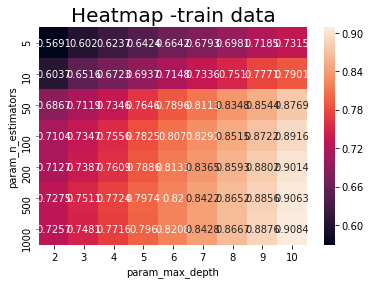

In [87]:
#https://towardsdatascience.com/using-3d-visualizations-to-tune-hyperparameters-of-ml-models-with-python-ba2885eab2e9
max_scores = cv_res.groupby(['param_n_estimators', 'param_max_depth']).max()
max_scores = max_scores.unstack()[['mean_test_score', 'mean_train_score']]
plt.title("Heatmap -train data" , size=20)
sns.heatmap(max_scores.mean_train_score, annot=True, fmt='.4g')

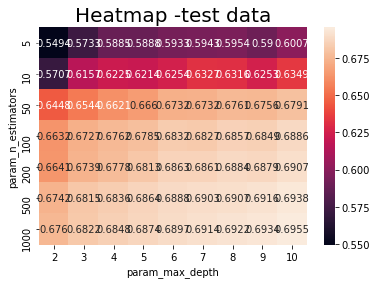

In [88]:
plt.title("Heatmap -test data" , size=20)
sns.heatmap(max_scores.mean_test_score, annot=True, fmt='.4g')

In [89]:
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
import numpy as np

In [90]:
x1 = [0, 1, 2, 3, 4, 5, 6, 7, 8]
y1 = [0, 1, 2, 3, 4, 5, 6, 7, 8]
z1 = [0, 1, 2, 3, 4, 5, 6, 7, 8]

x2 = [0, 1, 2, 3, 4, 5, 6, 7, 8]
y2 = [0, 1, 2, 3, 4, 5, 6, 7, 8]
z2 = [1, 0, 3, 2, 5, 4, 7, 6, 8]

In [91]:
# https://plot.ly/python/3d-axes/
trace1 = go.Scatter3d(x=x1,y=y1,z=z1, name = 'train')
trace2 = go.Scatter3d(x=x2,y=y2,z=z2, name = 'Cross validation')
data = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='n_estimators'),
        yaxis = dict(title='max_depth'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

In [92]:
def batch_predict(clf, data):
    # roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
    # not the predicted outputs

    y_data_pred = []
    tr_loop = data.shape[0] - data.shape[0]%1000
    # consider you X_tr shape is 49041, then your cr_loop will be 49041 - 49041%1000 = 49000
    # in this for loop we will iterate unti the last 1000 multiplier
    for i in range(0, tr_loop, 1000):
        y_data_pred.extend(clf.predict_proba(data[i:i+1000])[:,1])
    # we will be predicting for the last data points
    y_data_pred.extend(clf.predict_proba(data[tr_loop:])[:,1])
    
    return y_data_pred

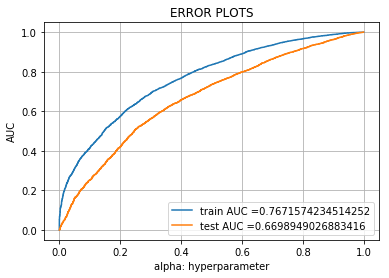

Wall time: 37.5 s


In [96]:
%%time
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc

rf = RandomForestClassifier(random_state=5,class_weight = 'balanced',max_depth= 5, n_estimators= 1000)
rf.fit(X1_train, y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs
y_train_pred = batch_predict(rf, X1_train)    
y_test_pred = batch_predict(rf, X1_test)

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("alpha: hyperparameter")
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

In [97]:
# we are writing our own function for predict, with defined thresould
# we will pick a threshold that will give the least fpr
def predict(proba, threshould, fpr, tpr):
    
    t = threshould[np.argmax(tpr*(1-fpr))]
    
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    predictions = []
    for i in proba:
        if i>=t:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions

In [98]:
print("="*100)
from sklearn.metrics import confusion_matrix
print("Train confusion matrix")
print(confusion_matrix(y_train, predict(y_train_pred, tr_thresholds, train_fpr, train_fpr)))
print("Test confusion matrix")
print(confusion_matrix(y_test, predict(y_test_pred, tr_thresholds, test_fpr, test_fpr)))

Train confusion matrix
the maximum value of tpr*(1-fpr) 0.24999997915340996 for threshold 0.49
[[ 1731  1732]
 [ 3136 15846]]
Test confusion matrix
the maximum value of tpr*(1-fpr) 0.25 for threshold 0.497
[[ 1304  1242]
 [ 3845 10109]]


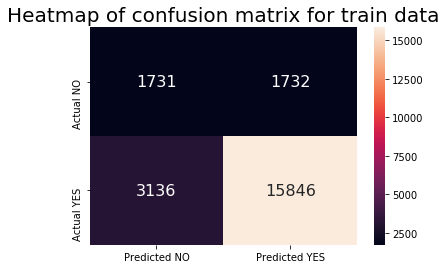

In [99]:
array = [[1731,1732], 
        [3136,15846]]
df_cm = pd.DataFrame(array, index = ['Actual NO', 'Actual YES'],
                  columns = ['Predicted NO','Predicted YES'])
plt.figure(figsize = (6,4))
plt.title("Heatmap of confusion matrix for train data" , size=20)
sns.heatmap(df_cm, annot=True,annot_kws={"size": 16}, fmt='g')

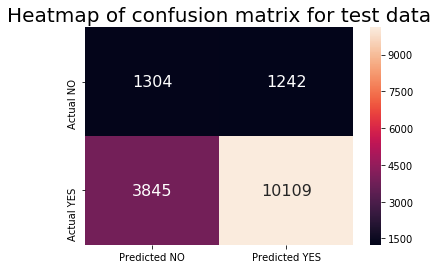

In [100]:
array = [[1304,1242], 
        [3845,10109]]
df_cm = pd.DataFrame(array, index = ['Actual NO', 'Actual YES'],
                  columns = ['Predicted NO','Predicted YES'])
plt.figure(figsize = (6,4))
plt.title("Heatmap of confusion matrix for test data" , size=20)
sns.heatmap(df_cm, annot=True,annot_kws={"size": 16}, fmt='g')

### 2.4.2 Applying Random Forests on TFIDF,<font color='red'> SET 2</font>

In [101]:
# Please write all the code with proper documentation

In [102]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
X2_train = hstack((X_train_school_state_res_code, X_train_teacher_prefix_res_code, X_train_project_grade_category_res_code, X_train_preprocessed_essays_tfidf, X_train_preprocessed_project_title_tfidf, X_train_clean_categories_res_code, X_train_clean_subcategories_res_code, X_train_price_norm, X_train_Compound_Sentiment_scores_norm,X_train_Positive_Sentiment_scores_norm, X_train_Negative_Sentiment_scores_norm, X_train_Neutral_Sentiment_scores_norm)).tocsr()
X2_train.shape

(22445, 6872)

In [103]:
X2_cv = hstack((X_cv_school_state_res_code, X_cv_teacher_prefix_res_code, X_cv_project_grade_category_res_code, X_cv_preprocessed_essays_tfidf, X_cv_preprocessed_project_title_tfidf, X_cv_clean_categories_res_code, X_cv_clean_subcategories_res_code, X_cv_price_norm, X_cv_Compound_Sentiment_scores_norm,X_cv_Positive_Sentiment_scores_norm, X_cv_Negative_Sentiment_scores_norm, X_cv_Neutral_Sentiment_scores_norm)).tocsr()
X2_cv.shape

(11055, 6872)

In [104]:
X2_test = hstack((X_test_school_state_res_code, X_test_teacher_prefix_res_code, X_test_project_grade_category_res_code, X_test_preprocessed_essays_tfidf, X_test_preprocessed_project_title_tfidf, X_test_clean_categories_res_code, X_test_clean_subcategories_res_code, X_test_price_norm, X_test_Compound_Sentiment_scores_norm,X_test_Positive_Sentiment_scores_norm, X_test_Negative_Sentiment_scores_norm, X_test_Neutral_Sentiment_scores_norm)).tocsr()
X2_test.shape

(16500, 6872)

In [105]:
%%time
# https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html
from sklearn.datasets import *
from sklearn import linear_model
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier

#Using GridSearchCV
n_estimators = [5, 10, 50, 100, 200, 500, 1000]
depth = [2, 3, 4, 5, 6, 7, 8, 9, 10]
RF = RandomForestClassifier(random_state=0,min_samples_split=2,class_weight = 'balanced',criterion='gini')
parameters = {'max_depth': depth,'n_estimators':n_estimators}
clf = GridSearchCV(RF, parameters, cv=3, scoring='roc_auc')
clf.fit(X2_train, y_train)

Wall time: 26min 2s


In [106]:
print(clf.best_estimator_)

RandomForestClassifier(bootstrap=True, class_weight='balanced',
            criterion='gini', max_depth=10, max_features='auto',
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators=1000, n_jobs=None, oob_score=False,
            random_state=0, verbose=0, warm_start=False)


In [107]:
print("The best value of alpha:",clf.best_params_)

The best value of alpha: {'max_depth': 10, 'n_estimators': 1000}


In [108]:
clf.cv_results_

{'mean_fit_time': array([ 0.157245  ,  0.21375958,  0.45676573,  0.84474071,  1.50198118,
         3.40790184,  6.41914932,  0.16954509,  0.21808171,  0.55317537,
         0.98303533,  1.88395548,  4.66765761,  8.57571284,  0.17253764,
         0.246008  ,  0.66754587,  1.19546612,  2.28554869,  5.54781747,
        10.68498532,  0.2130967 ,  0.33876014,  0.77060421,  1.40022985,
         2.68765108,  6.7203904 , 13.63705166,  0.19514489,  0.28889402,
         0.91056323,  1.92984573,  3.50196123,  8.22983869, 16.50555929,
         0.22016692,  0.32223789,  1.05889821,  2.01157339,  3.74745003,
         9.20966037, 18.30379653,  0.22803934,  0.3299497 ,  1.20137628,
         2.2877032 ,  4.60269809, 11.90863514, 22.85515515,  0.24102275,
         0.36734962,  1.36152093,  2.56789525,  4.99865309, 12.30078626,
        24.84218629,  0.25631412,  0.40824135,  1.57469662,  2.90459379,
         5.85217746, 14.98030957, 29.88576976]),
 'std_fit_time': array([0.00529796, 0.01801393, 0.0135641 

In [109]:
cv_res = pd.DataFrame(clf.cv_results_)
print(cv_res)

    mean_fit_time  std_fit_time  mean_score_time  std_score_time  \
0        0.157245      0.005298         0.062832        0.005701   
1        0.213760      0.018014         0.085107        0.006632   
2        0.456766      0.013564         0.271605        0.018738   
3        0.844741      0.009908         0.464767        0.030318   
4        1.501981      0.023977         0.935164        0.081922   
5        3.407902      0.350804         2.104714        0.064015   
6        6.419149      0.095588         4.218378        0.105184   
7        0.169545      0.002154         0.059508        0.002487   
8        0.218082      0.005298         0.080120        0.003390   
9        0.553175      0.005179         0.249334        0.005086   
10       0.983035      0.013188         0.468746        0.008144   
11       1.883955      0.032080         0.879659        0.013319   
12       4.667658      0.287726         2.184487        0.089591   
13       8.575713      0.019515         4.170848

[63 rows x 18 columns]


In [110]:
cv_res.columns

Index(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
       'param_max_depth', 'param_n_estimators', 'params', 'split0_test_score',
       'split1_test_score', 'split2_test_score', 'mean_test_score',
       'std_test_score', 'rank_test_score', 'split0_train_score',
       'split1_train_score', 'split2_train_score', 'mean_train_score',
       'std_train_score'],
      dtype='object')

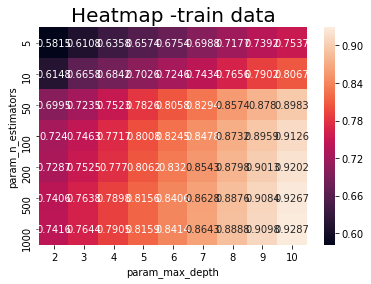

In [111]:
#https://towardsdatascience.com/using-3d-visualizations-to-tune-hyperparameters-of-ml-models-with-python-ba2885eab2e9
max_scores = cv_res.groupby(['param_n_estimators', 'param_max_depth']).max()
max_scores = max_scores.unstack()[['mean_test_score', 'mean_train_score']]
plt.title("Heatmap -train data" , size=20)
sns.heatmap(max_scores.mean_train_score, annot=True, fmt='.4g')

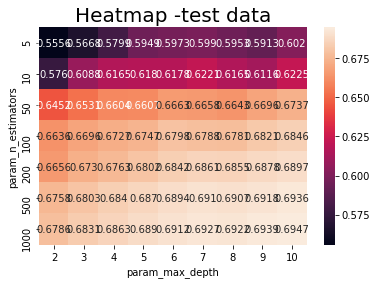

In [112]:
plt.title("Heatmap -test data" , size=20)
sns.heatmap(max_scores.mean_test_score, annot=True, fmt='.4g')

In [113]:
# https://plot.ly/python/3d-axes/
trace1 = go.Scatter3d(x=x1,y=y1,z=z1, name = 'train')
trace2 = go.Scatter3d(x=x2,y=y2,z=z2, name = 'Cross validation')
data = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='n_estimators'),
        yaxis = dict(title='max_depth'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

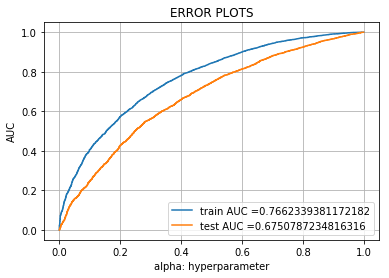

Wall time: 59.2 s


In [116]:
%%time
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc

rf = RandomForestClassifier(random_state=5,class_weight = 'balanced',max_depth= 4, n_estimators= 1000)
rf.fit(X2_train, y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs
y_train_pred = batch_predict(rf, X2_train)    
y_test_pred = batch_predict(rf, X2_test)

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("alpha: hyperparameter")
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

In [117]:
print("="*100)
from sklearn.metrics import confusion_matrix
print("Train confusion matrix")
print(confusion_matrix(y_train, predict(y_train_pred, tr_thresholds, train_fpr, train_fpr)))
print("Test confusion matrix")
print(confusion_matrix(y_test, predict(y_test_pred, tr_thresholds, test_fpr, test_fpr)))

Train confusion matrix
the maximum value of tpr*(1-fpr) 0.24999997915340996 for threshold 0.492
[[ 1731  1732]
 [ 2967 16015]]
Test confusion matrix
the maximum value of tpr*(1-fpr) 0.25 for threshold 0.499
[[ 1333  1213]
 [ 3817 10137]]


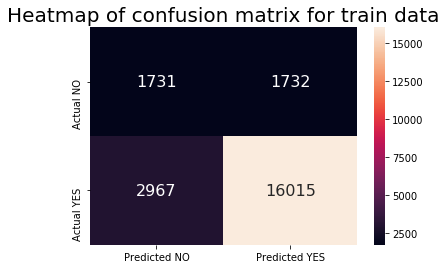

In [118]:
array = [[1731,1732], 
        [2967,16015]]
df_cm = pd.DataFrame(array, index = ['Actual NO', 'Actual YES'],
                  columns = ['Predicted NO','Predicted YES'])
plt.figure(figsize = (6,4))
plt.title("Heatmap of confusion matrix for train data" , size=20)
sns.heatmap(df_cm, annot=True,annot_kws={"size": 16}, fmt='g')

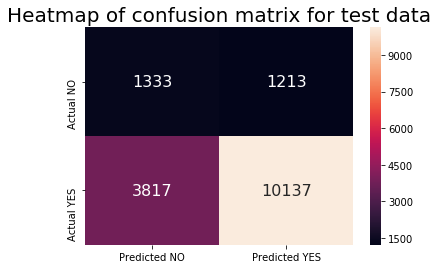

In [119]:
array = [[1333,1213], 
        [3817,10137]]
df_cm = pd.DataFrame(array, index = ['Actual NO', 'Actual YES'],
                  columns = ['Predicted NO','Predicted YES'])
plt.figure(figsize = (6,4))
plt.title("Heatmap of confusion matrix for test data" , size=20)
sns.heatmap(df_cm, annot=True,annot_kws={"size": 16}, fmt='g')

### 2.4.3 Applying Random Forests on AVG W2V,<font color='red'> SET 3</font>

In [120]:
# Please write all the code with proper documentation

In [122]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
X3_train = hstack((X_train_school_state_res_code, X_train_teacher_prefix_res_code, X_train_project_grade_category_res_code, X_train_preprocessed_essays_avg_w2v_vectors, X_train_preprocessed_project_title_tfidf, X_train_clean_categories_res_code, X_train_clean_subcategories_res_code, X_train_price_norm, X_train_Compound_Sentiment_scores_norm,X_train_Positive_Sentiment_scores_norm, X_train_Negative_Sentiment_scores_norm, X_train_Neutral_Sentiment_scores_norm)).tocsr()
X3_train.shape

(22445, 2172)

In [123]:
X3_cv = hstack((X_cv_school_state_res_code, X_cv_teacher_prefix_res_code, X_cv_project_grade_category_res_code, X_cv_preprocessed_essays_avg_w2v_vectors, X_cv_preprocessed_project_title_tfidf, X_cv_clean_categories_res_code, X_cv_clean_subcategories_res_code, X_cv_price_norm, X_cv_Compound_Sentiment_scores_norm,X_cv_Positive_Sentiment_scores_norm, X_cv_Negative_Sentiment_scores_norm, X_cv_Neutral_Sentiment_scores_norm)).tocsr()
X3_cv.shape

(11055, 2172)

In [124]:
X3_test = hstack((X_test_school_state_res_code, X_test_teacher_prefix_res_code, X_test_project_grade_category_res_code, X_test_preprocessed_essays_avg_w2v_vectors, X_test_preprocessed_project_title_tfidf, X_test_clean_categories_res_code, X_test_clean_subcategories_res_code, X_test_price_norm, X_test_Compound_Sentiment_scores_norm,X_test_Positive_Sentiment_scores_norm, X_test_Negative_Sentiment_scores_norm, X_test_Neutral_Sentiment_scores_norm)).tocsr()
X3_test.shape

(16500, 2172)

In [125]:
%%time
# https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html
from sklearn.datasets import *
from sklearn import linear_model
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier

#Using GridSearchCV
n_estimators = [5, 10, 50, 100, 200, 500, 1000]
depth = [2, 3, 4, 5, 6, 7, 8, 9, 10]
RF = RandomForestClassifier(random_state=0,min_samples_split=2,class_weight = 'balanced',criterion='gini')
parameters = {'max_depth': depth,'n_estimators':n_estimators}
clf = GridSearchCV(RF, parameters, cv=3, scoring='roc_auc')
clf.fit(X3_train, y_train)

Wall time: 2h 31min 42s


In [126]:
print(clf.best_estimator_)

RandomForestClassifier(bootstrap=True, class_weight='balanced',
            criterion='gini', max_depth=7, max_features='auto',
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators=1000, n_jobs=None, oob_score=False,
            random_state=0, verbose=0, warm_start=False)


In [127]:
print("The best value of alpha:",clf.best_params_)

The best value of alpha: {'max_depth': 7, 'n_estimators': 1000}


In [128]:
clf.cv_results_

{'mean_fit_time': array([3.57709090e-01, 4.31178967e-01, 1.27990802e+00, 2.46240942e+00,
        4.53152442e+00, 1.16415085e+01, 2.13240955e+01, 3.72668584e-01,
        5.08970658e-01, 1.70676541e+00, 3.21072737e+00, 6.06343635e+00,
        1.60721353e+01, 3.06185199e+01, 4.55415805e-01, 6.84930007e-01,
        2.39865414e+00, 4.45908713e+00, 8.38638425e+00, 2.15946317e+01,
        4.66887850e+01, 5.60457309e-01, 8.25950146e-01, 3.15459641e+00,
        5.71594636e+00, 1.11114128e+01, 2.74928019e+01, 5.53417610e+01,
        5.92727343e-01, 9.38427687e-01, 3.80256557e+00, 7.42686391e+00,
        1.45145596e+01, 3.60629960e+01, 7.20291691e+01, 7.05747525e-01,
        1.14299663e+00, 4.78726427e+00, 9.49944766e+00, 1.84335163e+01,
        4.54370376e+01, 9.07678688e+01, 7.89164543e-01, 1.31993866e+00,
        5.90130043e+00, 1.15576646e+01, 1.28725585e+03, 6.86280851e+01,
        1.37363971e+02, 1.01402203e+00, 1.70091987e+00, 8.01842451e+00,
        1.73390247e+01, 3.22943525e+01, 8.05537

In [129]:
cv_res = pd.DataFrame(clf.cv_results_)
print(cv_res)

    mean_fit_time  std_fit_time  mean_score_time  std_score_time  \
0        0.357709      0.008237         0.109706        0.007238   
1        0.431179      0.015543         0.121675        0.004535   
2        1.279908      0.025884         0.302525        0.019618   
3        2.462409      0.118948         0.576131        0.088060   
4        4.531524      0.467906         0.852728        0.002169   
5       11.641508      0.658821         2.362018        0.387751   
6       21.324095      1.802083         4.255803        0.522865   
7        0.372669      0.011583         0.099069        0.004016   
8        0.508971      0.004017         0.118683        0.005340   
9        1.706765      0.042815         0.275263        0.002936   
10       3.210727      0.027981         0.458772        0.002937   
11       6.063436      0.002618         0.840086        0.008933   
12      16.072135      1.158540         2.692441        0.673401   
13      30.618520      0.572123         3.933031

[63 rows x 18 columns]


In [130]:
cv_res.columns

Index(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
       'param_max_depth', 'param_n_estimators', 'params', 'split0_test_score',
       'split1_test_score', 'split2_test_score', 'mean_test_score',
       'std_test_score', 'rank_test_score', 'split0_train_score',
       'split1_train_score', 'split2_train_score', 'mean_train_score',
       'std_train_score'],
      dtype='object')

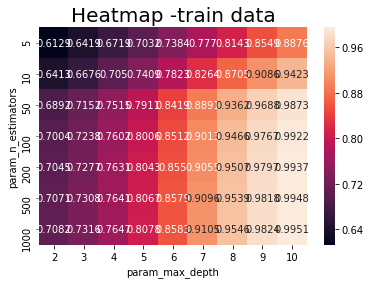

In [131]:
#https://towardsdatascience.com/using-3d-visualizations-to-tune-hyperparameters-of-ml-models-with-python-ba2885eab2e9
max_scores = cv_res.groupby(['param_n_estimators', 'param_max_depth']).max()
max_scores = max_scores.unstack()[['mean_test_score', 'mean_train_score']]
plt.title("Heatmap -train data" , size=20)
sns.heatmap(max_scores.mean_train_score, annot=True, fmt='.4g')

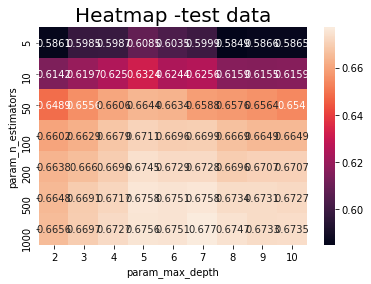

In [132]:
plt.title("Heatmap -test data" , size=20)
sns.heatmap(max_scores.mean_test_score, annot=True, fmt='.4g')

In [133]:
# https://plot.ly/python/3d-axes/
trace1 = go.Scatter3d(x=x1,y=y1,z=z1, name = 'train')
trace2 = go.Scatter3d(x=x2,y=y2,z=z2, name = 'Cross validation')
data = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='n_estimators'),
        yaxis = dict(title='max_depth'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

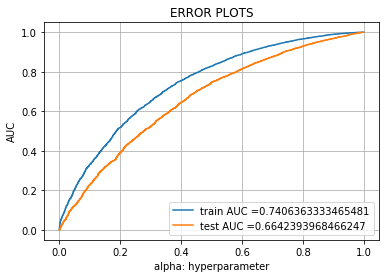

Wall time: 1min 27s


In [135]:
%%time
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc

rf = RandomForestClassifier(random_state=5,class_weight = 'balanced',max_depth= 4, n_estimators= 1000)
rf.fit(X3_train, y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs
y_train_pred = batch_predict(rf, X3_train)    
y_test_pred = batch_predict(rf, X3_test)

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("alpha: hyperparameter")
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

In [136]:
print("="*100)
from sklearn.metrics import confusion_matrix
print("Train confusion matrix")
print(confusion_matrix(y_train, predict(y_train_pred, tr_thresholds, train_fpr, train_fpr)))
print("Test confusion matrix")
print(confusion_matrix(y_test, predict(y_test_pred, tr_thresholds, test_fpr, test_fpr)))

Train confusion matrix
the maximum value of tpr*(1-fpr) 0.24999997915341 for threshold 0.485
[[ 1732  1731]
 [ 3267 15715]]
Test confusion matrix
the maximum value of tpr*(1-fpr) 0.25 for threshold 0.499
[[1360 1186]
 [4020 9934]]


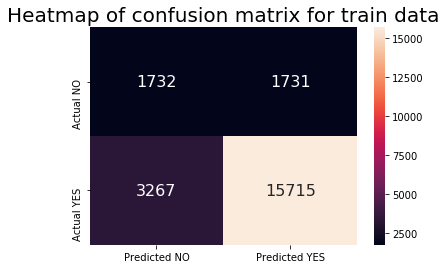

In [137]:
array = [[1732,1731], 
        [3267,15715]]
df_cm = pd.DataFrame(array, index = ['Actual NO', 'Actual YES'],
                  columns = ['Predicted NO','Predicted YES'])
plt.figure(figsize = (6,4))
plt.title("Heatmap of confusion matrix for train data" , size=20)
sns.heatmap(df_cm, annot=True,annot_kws={"size": 16}, fmt='g')

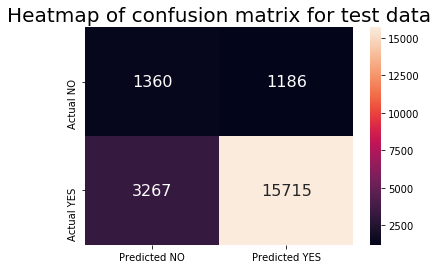

In [138]:
array = [[1360,1186], 
        [3267,15715]]
df_cm = pd.DataFrame(array, index = ['Actual NO', 'Actual YES'],
                  columns = ['Predicted NO','Predicted YES'])
plt.figure(figsize = (6,4))
plt.title("Heatmap of confusion matrix for test data" , size=20)
sns.heatmap(df_cm, annot=True,annot_kws={"size": 16}, fmt='g')

### 2.4.4 Applying Random Forests on TFIDF W2V,<font color='red'> SET 4</font>

In [139]:
# Please write all the code with proper documentation

In [140]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
X4_train = hstack((X_train_school_state_res_code, X_train_teacher_prefix_res_code, X_train_project_grade_category_res_code, X_train_preprocessed_essays_tfidf_w2v_vectors, X_train_preprocessed_project_title_tfidf, X_train_clean_categories_res_code, X_train_clean_subcategories_res_code, X_train_price_norm, X_train_Compound_Sentiment_scores_norm,X_train_Positive_Sentiment_scores_norm, X_train_Negative_Sentiment_scores_norm, X_train_Neutral_Sentiment_scores_norm)).tocsr()
X4_train.shape

(22445, 2172)

In [141]:
X4_cv = hstack((X_cv_school_state_res_code, X_cv_teacher_prefix_res_code, X_cv_project_grade_category_res_code, X_cv_preprocessed_essays_tfidf_w2v_vectors, X_cv_preprocessed_project_title_tfidf, X_cv_clean_categories_res_code, X_cv_clean_subcategories_res_code, X_cv_price_norm, X_cv_Compound_Sentiment_scores_norm,X_cv_Positive_Sentiment_scores_norm, X_cv_Negative_Sentiment_scores_norm, X_cv_Neutral_Sentiment_scores_norm)).tocsr()
X4_cv.shape

(11055, 2172)

In [142]:
X4_test = hstack((X_test_school_state_res_code, X_test_teacher_prefix_res_code, X_test_project_grade_category_res_code, X_test_preprocessed_essays_tfidf_w2v_vectors, X_test_preprocessed_project_title_tfidf, X_test_clean_categories_res_code, X_test_clean_subcategories_res_code, X_test_price_norm, X_test_Compound_Sentiment_scores_norm,X_test_Positive_Sentiment_scores_norm, X_test_Negative_Sentiment_scores_norm, X_test_Neutral_Sentiment_scores_norm)).tocsr()
X4_test.shape

(16500, 2172)

In [143]:
%%time
# https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html
from sklearn.datasets import *
from sklearn import linear_model
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier

#Using GridSearchCV
n_estimators = [5, 10, 50, 100, 200, 500, 1000]
depth = [2, 3, 4, 5, 6, 7, 8, 9, 10]
RF = RandomForestClassifier(random_state=0,min_samples_split=2,class_weight = 'balanced',criterion='gini')
parameters = {'max_depth': depth,'n_estimators':n_estimators}
clf = GridSearchCV(RF, parameters, cv=3, scoring='roc_auc')
clf.fit(X4_train, y_train)

Wall time: 5h 23min 41s


In [144]:
print(clf.best_estimator_)

RandomForestClassifier(bootstrap=True, class_weight='balanced',
            criterion='gini', max_depth=5, max_features='auto',
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators=1000, n_jobs=None, oob_score=False,
            random_state=0, verbose=0, warm_start=False)


In [145]:
print("The best value of alpha:",clf.best_params_)

The best value of alpha: {'max_depth': 5, 'n_estimators': 1000}


In [146]:
clf.cv_results_

{'mean_fit_time': array([3.75660499e-01, 4.95988051e-01, 1.67551502e+00, 2.93462920e+00,
        4.83062394e+00, 1.16620986e+01, 2.26606800e+01, 3.74289195e-01,
        5.01332839e-01, 1.63342007e+00, 3.14330665e+00, 5.99774694e+00,
        1.46798038e+01, 2.95234773e+01, 4.39750830e-01, 6.30689859e-01,
        2.26830467e+00, 4.25787044e+00, 8.20790076e+00, 2.03727012e+01,
        4.07392604e+01, 5.35918951e-01, 7.56232341e-01, 3.07466833e+00,
        6.11353858e+00, 1.10394301e+01, 2.73754598e+01, 9.67417087e+01,
        1.16391977e+00, 1.84006818e+00, 7.61448948e+00, 1.48741225e+01,
        2.92348813e+01, 7.39488414e+01, 1.44613718e+02, 1.32646966e+00,
        2.26481462e+00, 9.25865436e+00, 1.84949229e+01, 3.47443087e+01,
        9.44709467e+02, 1.87703779e+02, 1.54767839e+00, 2.69154334e+00,
        1.18037628e+01, 2.32498329e+01, 4.57221136e+01, 7.21519116e+02,
        2.27685449e+03, 1.77917266e+00, 3.14396199e+00, 1.41782266e+01,
        2.79294945e+01, 5.54235666e+01, 1.52646

In [147]:
cv_res = pd.DataFrame(clf.cv_results_)
print(cv_res)

    mean_fit_time  std_fit_time  mean_score_time  std_score_time  \
0        0.375660      0.019885         0.108378        0.004098   
1        0.495988      0.008216         0.144615        0.011546   
2        1.675515      0.064593         0.355051        0.029631   
3        2.934629      0.180349         0.635214        0.037690   
4        4.830624      0.408994         0.991458        0.057499   
5       11.662099      0.383231         2.308486        0.046464   
6       22.660680      1.124359         4.839432        0.259832   
7        0.374289      0.012315         0.096069        0.002623   
8        0.501333      0.010632         0.119402        0.008784   
9        1.633420      0.004435         0.267525        0.004065   
10       3.143307      0.036084         0.459122        0.003141   
11       5.997747      0.034978         0.832628        0.012080   
12      14.679804      0.030404         1.972498        0.031768   
13      29.523477      0.026613         3.812462

[63 rows x 18 columns]


In [148]:
cv_res.columns

Index(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
       'param_max_depth', 'param_n_estimators', 'params', 'split0_test_score',
       'split1_test_score', 'split2_test_score', 'mean_test_score',
       'std_test_score', 'rank_test_score', 'split0_train_score',
       'split1_train_score', 'split2_train_score', 'mean_train_score',
       'std_train_score'],
      dtype='object')

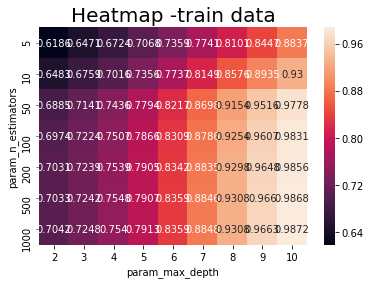

In [149]:
#https://towardsdatascience.com/using-3d-visualizations-to-tune-hyperparameters-of-ml-models-with-python-ba2885eab2e9
max_scores = cv_res.groupby(['param_n_estimators', 'param_max_depth']).max()
max_scores = max_scores.unstack()[['mean_test_score', 'mean_train_score']]
plt.title("Heatmap -train data" , size=20)
sns.heatmap(max_scores.mean_train_score, annot=True, fmt='.4g')

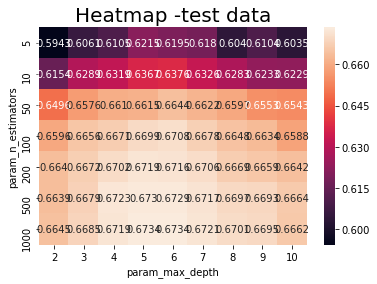

In [150]:
plt.title("Heatmap -test data" , size=20)
sns.heatmap(max_scores.mean_test_score, annot=True, fmt='.4g')

In [151]:
# https://plot.ly/python/3d-axes/
trace1 = go.Scatter3d(x=x1,y=y1,z=z1, name = 'train')
trace2 = go.Scatter3d(x=x2,y=y2,z=z2, name = 'Cross validation')
data = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='n_estimators'),
        yaxis = dict(title='max_depth'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

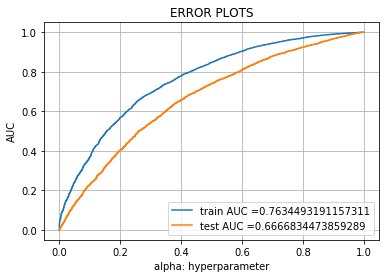

Wall time: 4min 1s


In [152]:
%%time
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc

rf = RandomForestClassifier(random_state=5,class_weight = 'balanced',max_depth= 5, n_estimators= 1000)
rf.fit(X4_train, y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs
y_train_pred = batch_predict(rf, X4_train)    
y_test_pred = batch_predict(rf, X4_test)

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("alpha: hyperparameter")
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

In [153]:
print("="*100)
from sklearn.metrics import confusion_matrix
print("Train confusion matrix")
print(confusion_matrix(y_train, predict(y_train_pred, tr_thresholds, train_fpr, train_fpr)))
print("Test confusion matrix")
print(confusion_matrix(y_test, predict(y_test_pred, tr_thresholds, test_fpr, test_fpr)))

Train confusion matrix
the maximum value of tpr*(1-fpr) 0.24999997915341 for threshold 0.474
[[ 1732  1731]
 [ 2912 16070]]
Test confusion matrix
the maximum value of tpr*(1-fpr) 0.25 for threshold 0.492
[[ 1315  1231]
 [ 3798 10156]]


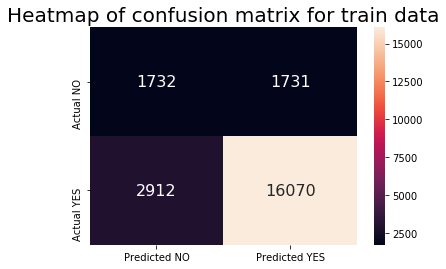

In [154]:
array = [[1732,1731], 
        [2912,16070]]
df_cm = pd.DataFrame(array, index = ['Actual NO', 'Actual YES'],
                  columns = ['Predicted NO','Predicted YES'])
plt.figure(figsize = (6,4))
plt.title("Heatmap of confusion matrix for train data" , size=20)
sns.heatmap(df_cm, annot=True,annot_kws={"size": 16}, fmt='g')

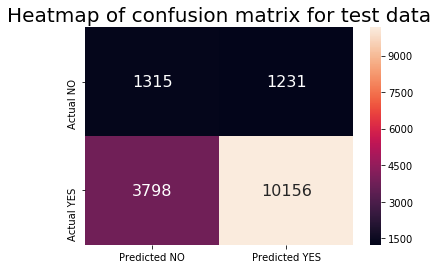

In [155]:
array = [[1315,1231], 
        [3798,10156]]
df_cm = pd.DataFrame(array, index = ['Actual NO', 'Actual YES'],
                  columns = ['Predicted NO','Predicted YES'])
plt.figure(figsize = (6,4))
plt.title("Heatmap of confusion matrix for test data" , size=20)
sns.heatmap(df_cm, annot=True,annot_kws={"size": 16}, fmt='g')

<h2>2.5 Applying GBDT</h2>

<br>Apply GBDT on different kind of featurization as mentioned in the instructions
<br> For Every model that you work on make sure you do the step 2 and step 3 of instrucations

### 2.5.1 Applying XGBOOST on BOW,<font color='red'> SET 1</font>

In [156]:
# Please write all the code with proper documentation

In [157]:
%%time
import xgboost as xgb
from sklearn.model_selection import RandomizedSearchCV
n_estimators = [5, 10, 50, 100, 200, 500, 1000]
depth = [2, 3, 4, 5, 6, 7, 8, 9, 10]
GB = xgb.XGBClassifier(learning_rate=0.1,random_state=0,min_samples_split=2)
parameters = {'max_depth': depth,'n_estimators':n_estimators}
clf = RandomizedSearchCV(GB, parameters, cv=3, scoring='roc_auc')
clf.fit(X1_train, y_train)

Wall time: 1h 49s


In [158]:
print(clf.best_estimator_)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0, learning_rate=0.1,
       max_delta_step=0, max_depth=4, min_child_weight=1,
       min_samples_split=2, missing=None, n_estimators=200, n_jobs=1,
       nthread=None, objective='binary:logistic', random_state=0,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=None, subsample=1, verbosity=1)


In [159]:
print("The best value of alpha:",clf.best_params_)

The best value of alpha: {'n_estimators': 200, 'max_depth': 4}


In [160]:
clf.cv_results_

{'mean_fit_time': array([177.40911126,  61.01133418,   3.33510367, 279.9968946 ,
          5.03967325,  40.4473381 , 456.18994466,  24.74266704,
          2.69761793, 122.53640294]),
 'std_fit_time': array([6.66221669e+00, 1.67879301e+00, 5.94156133e-02, 6.26117126e+01,
        1.18631901e-01, 2.06082159e-01, 1.37226880e+02, 5.19771644e-01,
        1.89367632e+00, 4.99157213e+00]),
 'mean_score_time': array([1.18240388, 0.8334167 , 0.63798102, 1.39423434, 0.72081685,
        0.7326835 , 1.83919446, 0.42459949, 0.39087518, 0.67034864]),
 'std_score_time': array([0.258816  , 0.03123755, 0.01339699, 0.23252012, 0.09591164,
        0.02428101, 0.49897561, 0.03012762, 0.0259604 , 0.02840948]),
 'param_n_estimators': masked_array(data=[1000, 100, 5, 500, 5, 100, 1000, 200, 5, 1000],
              mask=[False, False, False, False, False, False, False, False,
                    False, False],
        fill_value='?',
             dtype=object),
 'param_max_depth': masked_array(data=[3, 10, 7, 

In [161]:
cv_res = pd.DataFrame(clf.cv_results_)
print(cv_res)

   mean_fit_time  std_fit_time  mean_score_time  std_score_time  \
0     177.409111      6.662217         1.182404        0.258816   
1      61.011334      1.678793         0.833417        0.031238   
2       3.335104      0.059416         0.637981        0.013397   
3     279.996895     62.611713         1.394234        0.232520   
4       5.039673      0.118632         0.720817        0.095912   
5      40.447338      0.206082         0.732683        0.024281   
6     456.189945    137.226880         1.839194        0.498976   
7      24.742667      0.519772         0.424599        0.030128   
8       2.697618      1.893676         0.390875        0.025960   
9     122.536403      4.991572         0.670349        0.028409   

  param_n_estimators param_max_depth                                  params  \
0               1000               3  {'n_estimators': 1000, 'max_depth': 3}   
1                100              10  {'n_estimators': 100, 'max_depth': 10}   
2                  5  

In [162]:
cv_res.columns

Index(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
       'param_n_estimators', 'param_max_depth', 'params', 'split0_test_score',
       'split1_test_score', 'split2_test_score', 'mean_test_score',
       'std_test_score', 'rank_test_score', 'split0_train_score',
       'split1_train_score', 'split2_train_score', 'mean_train_score',
       'std_train_score'],
      dtype='object')

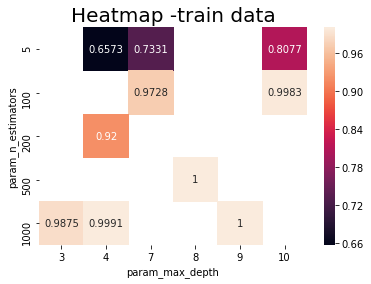

In [163]:
#https://towardsdatascience.com/using-3d-visualizations-to-tune-hyperparameters-of-ml-models-with-python-ba2885eab2e9
max_scores = cv_res.groupby(['param_n_estimators', 'param_max_depth']).max()
max_scores = max_scores.unstack()[['mean_test_score', 'mean_train_score']]
plt.title("Heatmap -train data" , size=20)
sns.heatmap(max_scores.mean_train_score, annot=True, fmt='.4g')

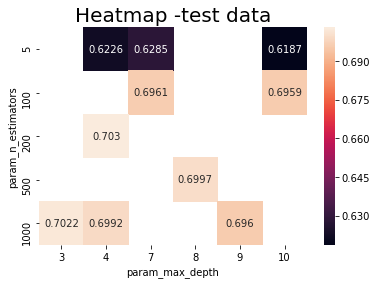

In [164]:
plt.title("Heatmap -test data" , size=20)
sns.heatmap(max_scores.mean_test_score, annot=True, fmt='.4g')

In [165]:
# https://plot.ly/python/3d-axes/
trace1 = go.Scatter3d(x=x1,y=y1,z=z1, name = 'train')
trace2 = go.Scatter3d(x=x2,y=y2,z=z2, name = 'Cross validation')
data = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='n_estimators'),
        yaxis = dict(title='max_depth'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

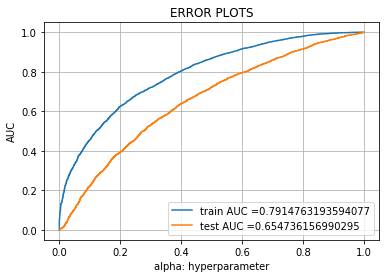

Wall time: 6min 52s


In [170]:
%%time
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc

gb = xgb.XGBClassifier(random_state=5,class_weight = 'balanced',max_depth= 4, n_estimators= 70)
gb.fit(X1_train, y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs
y_train_pred = batch_predict(gb, X1_train)    
y_test_pred = batch_predict(gb, X1_test)

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("alpha: hyperparameter")
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

In [171]:
print("="*100)
from sklearn.metrics import confusion_matrix
print("Train confusion matrix")
print(confusion_matrix(y_train, predict(y_train_pred, tr_thresholds, train_fpr, train_fpr)))
print("Test confusion matrix")
print(confusion_matrix(y_test, predict(y_test_pred, tr_thresholds, test_fpr, test_fpr)))

Train confusion matrix
the maximum value of tpr*(1-fpr) 0.24999997915341 for threshold 0.792
[[ 1732  1731]
 [ 2522 16460]]
Test confusion matrix
the maximum value of tpr*(1-fpr) 0.25 for threshold 0.823
[[ 1239  1307]
 [ 3722 10232]]


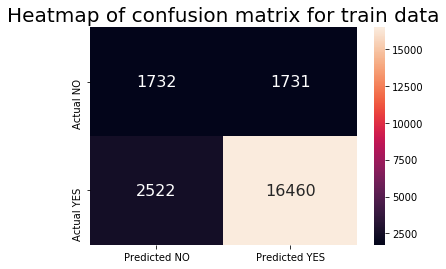

In [172]:
array = [[1732,1731], 
        [2522,16460]]
df_cm = pd.DataFrame(array, index = ['Actual NO', 'Actual YES'],
                  columns = ['Predicted NO','Predicted YES'])
plt.figure(figsize = (6,4))
plt.title("Heatmap of confusion matrix for train data" , size=20)
sns.heatmap(df_cm, annot=True,annot_kws={"size": 16}, fmt='g')

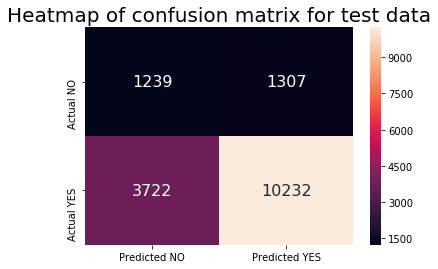

In [173]:
array = [[1239,1307], 
        [3722,10232]]
df_cm = pd.DataFrame(array, index = ['Actual NO', 'Actual YES'],
                  columns = ['Predicted NO','Predicted YES'])
plt.figure(figsize = (6,4))
plt.title("Heatmap of confusion matrix for test data" , size=20)
sns.heatmap(df_cm, annot=True,annot_kws={"size": 16}, fmt='g')

### 2.5.2 Applying XGBOOST on TFIDF,<font color='red'> SET 2</font>

In [174]:
# Please write all the code with proper documentation

In [175]:
%%time
import xgboost as xgb
from sklearn.model_selection import RandomizedSearchCV
n_estimators = [5, 10, 50, 100, 200, 500, 1000]
depth = [2, 3, 4, 5, 6, 7, 8, 9, 10]
GB = xgb.XGBClassifier(learning_rate=0.1,random_state=0,min_samples_split=2)
parameters = {'max_depth': depth,'n_estimators':n_estimators}
clf = RandomizedSearchCV(GB, parameters, cv=3, scoring='roc_auc')
clf.fit(X2_train, y_train)

Wall time: 2h 30min 40s


In [176]:
print(clf.best_estimator_)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0, learning_rate=0.1,
       max_delta_step=0, max_depth=5, min_child_weight=1,
       min_samples_split=2, missing=None, n_estimators=200, n_jobs=1,
       nthread=None, objective='binary:logistic', random_state=0,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=None, subsample=1, verbosity=1)


In [177]:
print("The best value of alpha:",clf.best_params_)

The best value of alpha: {'n_estimators': 200, 'max_depth': 5}


In [178]:
clf.cv_results_

{'mean_fit_time': array([ 215.67634805,    4.02090645,   71.59755802,   15.21497734,
        2361.62668244,    2.60171223,  219.02362235,    3.63363234,
          43.94293539,   26.57356191]),
 'std_fit_time': array([8.82632029e+00, 1.62805687e-02, 6.12593924e-01, 8.43229412e-02,
        2.45190092e+03, 9.83091683e-02, 1.00603733e+01, 5.10931137e-02,
        6.21893074e-01, 3.01698749e-01]),
 'mean_score_time': array([0.58622599, 0.44048047, 0.37498792, 0.31844759, 1.56562177,
        0.4345336 , 0.52153158, 0.31514605, 0.34772158, 0.36799351]),
 'std_score_time': array([0.04926436, 0.110381  , 0.00292564, 0.0049738 , 0.62960387,
        0.03376905, 0.01071764, 0.00889646, 0.00410832, 0.04724264]),
 'param_n_estimators': masked_array(data=[500, 5, 200, 50, 1000, 10, 1000, 5, 100, 50],
              mask=[False, False, False, False, False, False, False, False,
                    False, False],
        fill_value='?',
             dtype=object),
 'param_max_depth': masked_array(data=[6,

In [179]:
cv_res = pd.DataFrame(clf.cv_results_)
print(cv_res)

   mean_fit_time  std_fit_time  mean_score_time  std_score_time  \
0     215.676348      8.826320         0.586226        0.049264   
1       4.020906      0.016281         0.440480        0.110381   
2      71.597558      0.612594         0.374988        0.002926   
3      15.214977      0.084323         0.318448        0.004974   
4    2361.626682   2451.900924         1.565622        0.629604   
5       2.601712      0.098309         0.434534        0.033769   
6     219.023622     10.060373         0.521532        0.010718   
7       3.633632      0.051093         0.315146        0.008896   
8      43.942935      0.621893         0.347722        0.004108   
9      26.573562      0.301699         0.367994        0.047243   

  param_n_estimators param_max_depth                                  params  \
0                500               6   {'n_estimators': 500, 'max_depth': 6}   
1                  5               9     {'n_estimators': 5, 'max_depth': 9}   
2                200  

In [180]:
cv_res.columns

Index(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
       'param_n_estimators', 'param_max_depth', 'params', 'split0_test_score',
       'split1_test_score', 'split2_test_score', 'mean_test_score',
       'std_test_score', 'rank_test_score', 'split0_train_score',
       'split1_train_score', 'split2_train_score', 'mean_train_score',
       'std_train_score'],
      dtype='object')

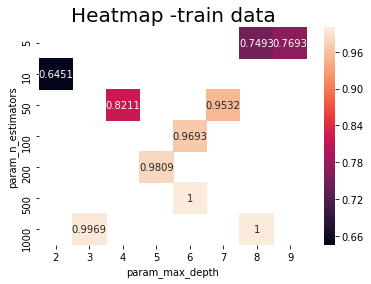

In [181]:
#https://towardsdatascience.com/using-3d-visualizations-to-tune-hyperparameters-of-ml-models-with-python-ba2885eab2e9
max_scores = cv_res.groupby(['param_n_estimators', 'param_max_depth']).max()
max_scores = max_scores.unstack()[['mean_test_score', 'mean_train_score']]
plt.title("Heatmap -train data" , size=20)
sns.heatmap(max_scores.mean_train_score, annot=True, fmt='.4g')

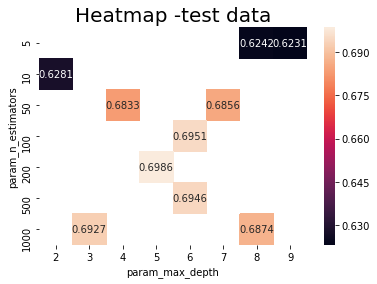

In [182]:
plt.title("Heatmap -test data" , size=20)
sns.heatmap(max_scores.mean_test_score, annot=True, fmt='.4g')

In [183]:
# https://plot.ly/python/3d-axes/
trace1 = go.Scatter3d(x=x1,y=y1,z=z1, name = 'train')
trace2 = go.Scatter3d(x=x2,y=y2,z=z2, name = 'Cross validation')
data = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='n_estimators'),
        yaxis = dict(title='max_depth'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

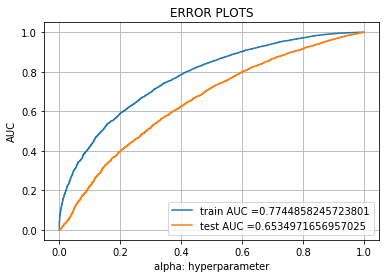

Wall time: 30.2 s


In [187]:
%%time
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc

gb = xgb.XGBClassifier(random_state=5,class_weight = 'balanced',max_depth= 3, n_estimators= 75)
gb.fit(X2_train, y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs
y_train_pred = batch_predict(gb, X2_train)    
y_test_pred = batch_predict(gb, X2_test)

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("alpha: hyperparameter")
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

In [188]:
print("="*100)
from sklearn.metrics import confusion_matrix
print("Train confusion matrix")
print(confusion_matrix(y_train, predict(y_train_pred, tr_thresholds, train_fpr, train_fpr)))
print("Test confusion matrix")
print(confusion_matrix(y_test, predict(y_test_pred, tr_thresholds, test_fpr, test_fpr)))

Train confusion matrix
the maximum value of tpr*(1-fpr) 0.24999997915341 for threshold 0.8
[[ 1732  1731]
 [ 2837 16145]]
Test confusion matrix
the maximum value of tpr*(1-fpr) 0.25 for threshold 0.83
[[1302 1244]
 [4061 9893]]


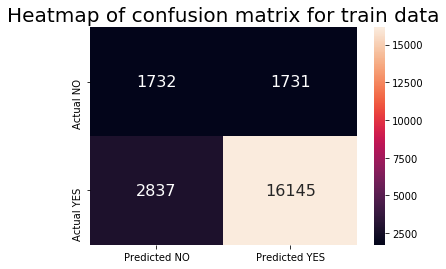

In [190]:
array = [[1732,1731], 
        [2837,16145]]
df_cm = pd.DataFrame(array, index = ['Actual NO', 'Actual YES'],
                  columns = ['Predicted NO','Predicted YES'])
plt.figure(figsize = (6,4))
plt.title("Heatmap of confusion matrix for train data" , size=20)
sns.heatmap(df_cm, annot=True,annot_kws={"size": 16}, fmt='g')

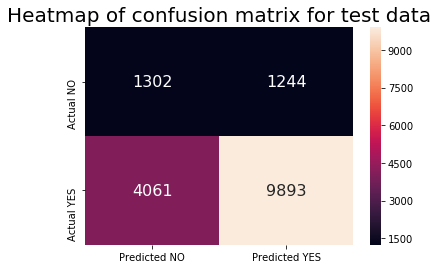

In [191]:
array = [[1302,1244], 
        [4061,9893]]
df_cm = pd.DataFrame(array, index = ['Actual NO', 'Actual YES'],
                  columns = ['Predicted NO','Predicted YES'])
plt.figure(figsize = (6,4))
plt.title("Heatmap of confusion matrix for test data" , size=20)
sns.heatmap(df_cm, annot=True,annot_kws={"size": 16}, fmt='g')

### 2.5.3 Applying XGBOOST on AVG W2V,<font color='red'> SET 3</font>

In [192]:
# Please write all the code with proper documentation

In [193]:
%%time
import xgboost as xgb
from sklearn.model_selection import RandomizedSearchCV
n_estimators = [5, 10, 50, 100, 200, 500, 1000]
depth = [2, 3, 4, 5, 6, 7, 8, 9, 10]
GB = xgb.XGBClassifier(learning_rate=0.1,random_state=0,min_samples_split=2)
parameters = {'max_depth': depth,'n_estimators':n_estimators}
clf = RandomizedSearchCV(GB, parameters, cv=3, scoring='roc_auc')
clf.fit(X3_train, y_train)

Wall time: 8h 42min 44s
Parser   : 132 ms


In [194]:
print(clf.best_estimator_)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0, learning_rate=0.1,
       max_delta_step=0, max_depth=10, min_child_weight=1,
       min_samples_split=2, missing=None, n_estimators=200, n_jobs=1,
       nthread=None, objective='binary:logistic', random_state=0,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=None, subsample=1, verbosity=1)


In [195]:
print("The best value of alpha:",clf.best_params_)

The best value of alpha: {'n_estimators': 200, 'max_depth': 10}


In [196]:
clf.cv_results_

{'mean_fit_time': array([1.78159670e+01, 1.00024308e+01, 3.39413182e+00, 2.31497309e+01,
        1.26141030e+02, 4.60068576e+00, 7.81964152e+03, 6.60162726e+01,
        2.07177557e+02, 1.86449051e+03]),
 'std_fit_time': array([1.45150083e+01, 7.67339465e-02, 3.06607945e-02, 1.48096739e-01,
        2.31296128e+00, 3.46631904e-02, 1.06911253e+04, 9.62300485e-01,
        9.50944294e+00, 1.69116119e+03]),
 'mean_score_time': array([0.72135154, 0.68796293, 0.69798557, 0.68548393, 0.78589662,
        0.67154209, 0.96374559, 0.74733686, 1.12475904, 1.92293668]),
 'std_score_time': array([0.03214081, 0.01892115, 0.04509279, 0.00750725, 0.00141018,
        0.03855852, 0.01849836, 0.01186984, 0.10974987, 0.55659613]),
 'param_n_estimators': masked_array(data=[10, 10, 5, 50, 200, 5, 500, 100, 200, 500],
              mask=[False, False, False, False, False, False, False, False,
                    False, False],
        fill_value='?',
             dtype=object),
 'param_max_depth': masked_array(

In [198]:
cv_res = pd.DataFrame(clf.cv_results_)
print(cv_res)

   mean_fit_time  std_fit_time  mean_score_time  std_score_time  \
0      17.815967     14.515008         0.721352        0.032141   
1      10.002431      0.076734         0.687963        0.018921   
2       3.394132      0.030661         0.697986        0.045093   
3      23.149731      0.148097         0.685484        0.007507   
4     126.141030      2.312961         0.785897        0.001410   
5       4.600686      0.034663         0.671542        0.038559   
6    7819.641521  10691.125295         0.963746        0.018498   
7      66.016273      0.962300         0.747337        0.011870   
8     207.177557      9.509443         1.124759        0.109750   
9    1864.490512   1691.161195         1.922937        0.556596   

  param_n_estimators param_max_depth                                  params  \
0                 10               7    {'n_estimators': 10, 'max_depth': 7}   
1                 10              10   {'n_estimators': 10, 'max_depth': 10}   
2                  5  

In [199]:
cv_res.columns

Index(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
       'param_n_estimators', 'param_max_depth', 'params', 'split0_test_score',
       'split1_test_score', 'split2_test_score', 'mean_test_score',
       'std_test_score', 'rank_test_score', 'split0_train_score',
       'split1_train_score', 'split2_train_score', 'mean_train_score',
       'std_train_score'],
      dtype='object')

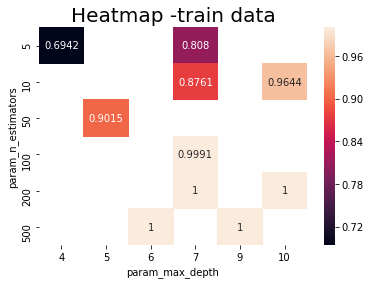

In [200]:
#https://towardsdatascience.com/using-3d-visualizations-to-tune-hyperparameters-of-ml-models-with-python-ba2885eab2e9
max_scores = cv_res.groupby(['param_n_estimators', 'param_max_depth']).max()
max_scores = max_scores.unstack()[['mean_test_score', 'mean_train_score']]
plt.title("Heatmap -train data" , size=20)
sns.heatmap(max_scores.mean_train_score, annot=True, fmt='.4g')

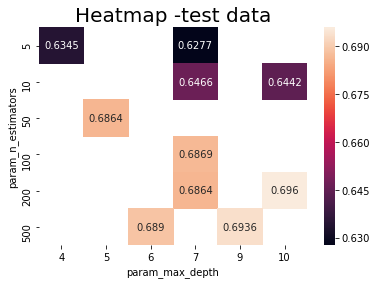

In [201]:
plt.title("Heatmap -test data" , size=20)
sns.heatmap(max_scores.mean_test_score, annot=True, fmt='.4g')

In [202]:
# https://plot.ly/python/3d-axes/
trace1 = go.Scatter3d(x=x1,y=y1,z=z1, name = 'train')
trace2 = go.Scatter3d(x=x2,y=y2,z=z2, name = 'Cross validation')
data = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='n_estimators'),
        yaxis = dict(title='max_depth'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

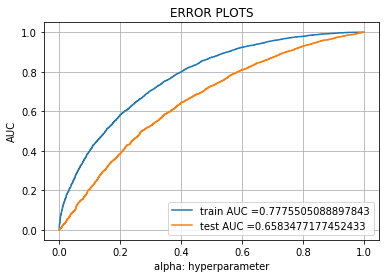

Wall time: 8min 20s


In [207]:
%%time
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc

gb = xgb.XGBClassifier(random_state=5,class_weight = 'balanced',max_depth= 3, n_estimators= 80)
gb.fit(X3_train, y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs
y_train_pred = batch_predict(gb, X3_train)    
y_test_pred = batch_predict(gb, X3_test)

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("alpha: hyperparameter")
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

In [208]:
print("="*100)
from sklearn.metrics import confusion_matrix
print("Train confusion matrix")
print(confusion_matrix(y_train, predict(y_train_pred, tr_thresholds, train_fpr, train_fpr)))
print("Test confusion matrix")
print(confusion_matrix(y_test, predict(y_test_pred, tr_thresholds, test_fpr, test_fpr)))

Train confusion matrix
the maximum value of tpr*(1-fpr) 0.24999997915341 for threshold 0.788
[[ 1732  1731]
 [ 2410 16572]]
Test confusion matrix
the maximum value of tpr*(1-fpr) 0.25 for threshold 0.832
[[1325 1221]
 [4035 9919]]


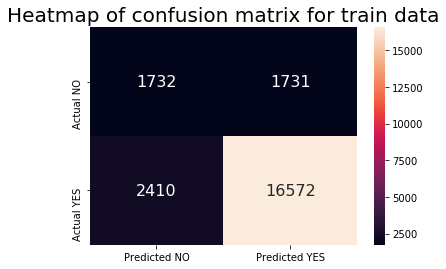

In [209]:
array = [[1732,1731], 
        [2410,16572]]
df_cm = pd.DataFrame(array, index = ['Actual NO', 'Actual YES'],
                  columns = ['Predicted NO','Predicted YES'])
plt.figure(figsize = (6,4))
plt.title("Heatmap of confusion matrix for train data" , size=20)
sns.heatmap(df_cm, annot=True,annot_kws={"size": 16}, fmt='g')

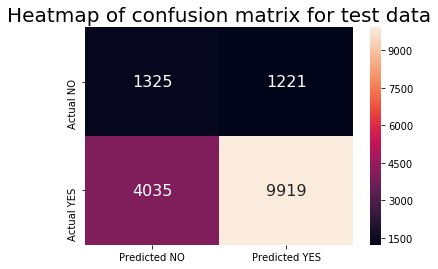

In [210]:
array = [[1325,1221], 
        [4035,9919]]
df_cm = pd.DataFrame(array, index = ['Actual NO', 'Actual YES'],
                  columns = ['Predicted NO','Predicted YES'])
plt.figure(figsize = (6,4))
plt.title("Heatmap of confusion matrix for test data" , size=20)
sns.heatmap(df_cm, annot=True,annot_kws={"size": 16}, fmt='g')

### 2.5.4 Applying XGBOOST on TFIDF W2V,<font color='red'> SET 4</font>

In [211]:
# Please write all the code with proper documentation

In [212]:
%%time
import xgboost as xgb
from sklearn.model_selection import RandomizedSearchCV
n_estimators = [5, 10, 50, 100, 200, 500, 1000]
depth = [2, 3, 4, 5, 6, 7, 8, 9, 10]
GB = xgb.XGBClassifier(learning_rate=0.1,random_state=0,min_samples_split=2)
parameters = {'max_depth': depth,'n_estimators':n_estimators}
clf = RandomizedSearchCV(GB, parameters, cv=3, scoring='roc_auc')
clf.fit(X4_train, y_train)

Wall time: 6h 36min 39s


In [213]:
print(clf.best_estimator_)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0, learning_rate=0.1,
       max_delta_step=0, max_depth=2, min_child_weight=1,
       min_samples_split=2, missing=None, n_estimators=500, n_jobs=1,
       nthread=None, objective='binary:logistic', random_state=0,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=None, subsample=1, verbosity=1)


In [214]:
print("The best value of alpha:",clf.best_params_)

The best value of alpha: {'n_estimators': 500, 'max_depth': 2}


In [215]:
clf.cv_results_

{'mean_fit_time': array([ 180.37894018, 3381.14624381,  933.81329338,  131.68696936,
        1711.40644972,  147.55179834,  835.99372212,   50.41501443,
           3.86102033,  463.52836021]),
 'std_fit_time': array([2.28408175e+00, 2.29257625e+03, 5.77564094e+02, 1.55582462e+00,
        1.92251684e+03, 2.17827763e+00, 2.24700201e+02, 3.12371507e+00,
        1.86168946e-01, 2.36922989e+01]),
 'mean_score_time': array([1.50360489, 2.19138352, 0.99367849, 1.53523366, 1.67221022,
        1.47037419, 2.11640914, 0.88559365, 0.99931041, 1.79350638]),
 'std_score_time': array([0.01937083, 0.62750829, 0.36457276, 0.09380715, 0.09084342,
        0.02650378, 0.02146152, 0.08249864, 0.07250536, 0.7149354 ]),
 'param_n_estimators': masked_array(data=[500, 1000, 100, 100, 500, 200, 500, 50, 5, 500],
              mask=[False, False, False, False, False, False, False, False,
                    False, False],
        fill_value='?',
             dtype=object),
 'param_max_depth': masked_array(data=

In [216]:
cv_res = pd.DataFrame(clf.cv_results_)
print(cv_res)

   mean_fit_time  std_fit_time  mean_score_time  std_score_time  \
0     180.378940      2.284082         1.503605        0.019371   
1    3381.146244   2292.576247         2.191384        0.627508   
2     933.813293    577.564094         0.993678        0.364573   
3     131.686969      1.555825         1.535234        0.093807   
4    1711.406450   1922.516844         1.672210        0.090843   
5     147.551798      2.178278         1.470374        0.026504   
6     835.993722    224.700201         2.116409        0.021462   
7      50.415014      3.123715         0.885594        0.082499   
8       3.861020      0.186169         0.999310        0.072505   
9     463.528360     23.692299         1.793506        0.714935   

  param_n_estimators param_max_depth                                  params  \
0                500               2   {'n_estimators': 500, 'max_depth': 2}   
1               1000               6  {'n_estimators': 1000, 'max_depth': 6}   
2                100  

In [217]:
cv_res.columns

Index(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
       'param_n_estimators', 'param_max_depth', 'params', 'split0_test_score',
       'split1_test_score', 'split2_test_score', 'mean_test_score',
       'std_test_score', 'rank_test_score', 'split0_train_score',
       'split1_train_score', 'split2_train_score', 'mean_train_score',
       'std_train_score'],
      dtype='object')

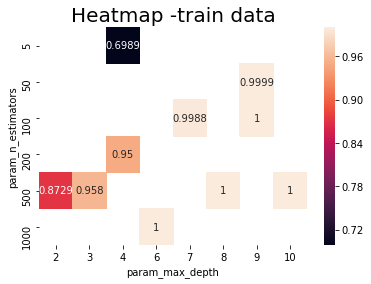

In [218]:
#https://towardsdatascience.com/using-3d-visualizations-to-tune-hyperparameters-of-ml-models-with-python-ba2885eab2e9
max_scores = cv_res.groupby(['param_n_estimators', 'param_max_depth']).max()
max_scores = max_scores.unstack()[['mean_test_score', 'mean_train_score']]
plt.title("Heatmap -train data" , size=20)
sns.heatmap(max_scores.mean_train_score, annot=True, fmt='.4g')

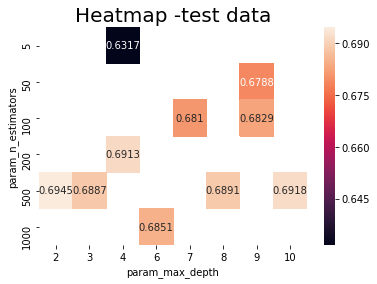

In [219]:
plt.title("Heatmap -test data" , size=20)
sns.heatmap(max_scores.mean_test_score, annot=True, fmt='.4g')

In [220]:
# https://plot.ly/python/3d-axes/
trace1 = go.Scatter3d(x=x1,y=y1,z=z1, name = 'train')
trace2 = go.Scatter3d(x=x2,y=y2,z=z2, name = 'Cross validation')
data = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='n_estimators'),
        yaxis = dict(title='max_depth'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

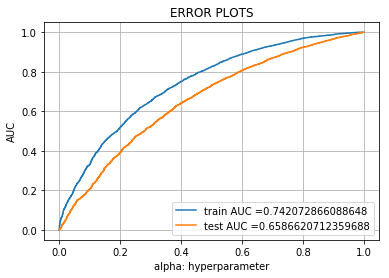

Wall time: 33.3 s


In [222]:
%%time
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc

gb = xgb.XGBClassifier(random_state=5,class_weight = 'balanced',max_depth= 2, n_estimators= 100)
gb.fit(X4_train, y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs
y_train_pred = batch_predict(gb, X4_train)    
y_test_pred = batch_predict(gb, X4_test)

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("alpha: hyperparameter")
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

In [223]:
print("="*100)
from sklearn.metrics import confusion_matrix
print("Train confusion matrix")
print(confusion_matrix(y_train, predict(y_train_pred, tr_thresholds, train_fpr, train_fpr)))
print("Test confusion matrix")
print(confusion_matrix(y_test, predict(y_test_pred, tr_thresholds, test_fpr, test_fpr)))

Train confusion matrix
the maximum value of tpr*(1-fpr) 0.24999997915341 for threshold 0.801
[[ 1732  1731]
 [ 3330 15652]]
Test confusion matrix
the maximum value of tpr*(1-fpr) 0.25 for threshold 0.831
[[1373 1173]
 [4265 9689]]


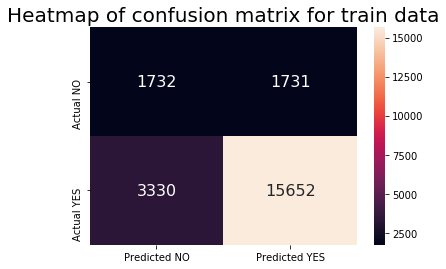

In [224]:
array = [[1732,1731], 
        [3330,15652]]
df_cm = pd.DataFrame(array, index = ['Actual NO', 'Actual YES'],
                  columns = ['Predicted NO','Predicted YES'])
plt.figure(figsize = (6,4))
plt.title("Heatmap of confusion matrix for train data" , size=20)
sns.heatmap(df_cm, annot=True,annot_kws={"size": 16}, fmt='g')

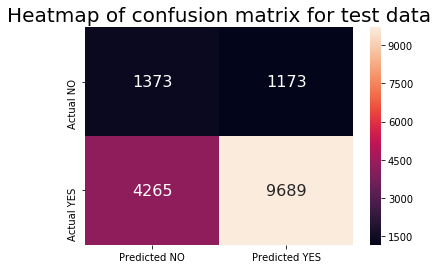

In [225]:
array = [[1373,1173], 
        [4265,9689]]
df_cm = pd.DataFrame(array, index = ['Actual NO', 'Actual YES'],
                  columns = ['Predicted NO','Predicted YES'])
plt.figure(figsize = (6,4))
plt.title("Heatmap of confusion matrix for test data" , size=20)
sns.heatmap(df_cm, annot=True,annot_kws={"size": 16}, fmt='g')

<h1>3. Conclusion</h1>

In [226]:
# Please compare all your models using Prettytable library

### Pretty Table for RANDOM FOREST

In [227]:
#http://zetcode.com/python/prettytable/
from prettytable import PrettyTable
    
x = PrettyTable()
x.field_names = ["Vectorizer", "Model", "Hyperparameter", "AUC"]
x.add_row(["Bag of Words", "Brute Force", 'max_depth: 5, n_estimators: 1000', 0.77])
x.add_row(["TFIDF", "Brute Force", 'max_depth: 4, n_estimators: 1000', 0.77])
x.add_row(["AVG W2V", "Brute Force", 'max_depth: 4, n_estimators: 1000', 0.74])
x.add_row(["TFIDF W2V", "Brute Force", 'max_depth: 5, n_estimators: 1000', 0.76])

print(x)

+--------------+-------------+----------------------------------+------+
|  Vectorizer  |    Model    |          Hyperparameter          | AUC  |
+--------------+-------------+----------------------------------+------+
| Bag of Words | Brute Force | max_depth: 5, n_estimators: 1000 | 0.77 |
|    TFIDF     | Brute Force | max_depth: 4, n_estimators: 1000 | 0.77 |
|   AVG W2V    | Brute Force | max_depth: 4, n_estimators: 1000 | 0.74 |
|  TFIDF W2V   | Brute Force | max_depth: 5, n_estimators: 1000 | 0.76 |
+--------------+-------------+----------------------------------+------+


### Pretty Table for GBDT

In [228]:
#http://zetcode.com/python/prettytable/
from prettytable import PrettyTable
    
x = PrettyTable()
x.field_names = ["Vectorizer", "Model", "Hyperparameter", "AUC"]
x.add_row(["Bag of Words", "Brute Force", 'max_depth: 4, n_estimators: 70', 0.79])
x.add_row(["TFIDF", "Brute Force", 'max_depth: 3, n_estimators: 75', 0.77])
x.add_row(["AVG W2V", "Brute Force", 'max_depth: 3, n_estimators: 80', 0.78])
x.add_row(["TFIDF W2V", "Brute Force", 'max_depth: 2, n_estimators: 100', 0.74])

print(x)

+--------------+-------------+---------------------------------+------+
|  Vectorizer  |    Model    |          Hyperparameter         | AUC  |
+--------------+-------------+---------------------------------+------+
| Bag of Words | Brute Force |  max_depth: 4, n_estimators: 70 | 0.79 |
|    TFIDF     | Brute Force |  max_depth: 3, n_estimators: 75 | 0.77 |
|   AVG W2V    | Brute Force |  max_depth: 3, n_estimators: 80 | 0.78 |
|  TFIDF W2V   | Brute Force | max_depth: 2, n_estimators: 100 | 0.74 |
+--------------+-------------+---------------------------------+------+
